In [1]:
% pylab inline
import tensorflow as tf
import numpy as np
# import matplotlib.pyplot as plt
from tqdm import tqdm
from tensorflow.contrib.kfac.python.ops.utils import fwd_gradients
import seaborn as sns
from utils import nn_l2_mean
slim = tf.contrib.slim
ds = tf.contrib.distributions
from universal_divergence import estimate

import os
os.environ["CUDA_VISIBLE_DEVICES"]="4"

Populating the interactive namespace from numpy and matplotlib


In [2]:
tf.reset_default_graph()
tf.set_random_seed(42)
np.random.seed(42)
beta = 0.02


### Generator and discriminator architectures

(same architecture as proposed in google brain paper)


In [3]:
def generator(z, output_dim=2, n_hidden=384, n_layer=6):
    with tf.variable_scope("generator"):
        with slim.arg_scope([slim.fully_connected], weights_regularizer=slim.l2_regularizer(beta)):
            h = slim.stack(z, slim.fully_connected, [n_hidden] * n_layer, activation_fn=tf.nn.relu)
            x = slim.fully_connected(h, output_dim, activation_fn=None)
    return x

def discriminator(x, n_hidden=384, n_layer=6, reuse=False):
    with tf.variable_scope("discriminator", reuse=reuse):
        with slim.arg_scope([slim.fully_connected], weights_regularizer=slim.l2_regularizer(beta)):
            h = slim.stack(x, slim.fully_connected, [n_hidden] * n_layer, activation_fn=tf.nn.relu)
            log_d = slim.fully_connected(h, 1, activation_fn=None)
    return log_d

### Data creation

In [4]:
def sample_mog(batch_size, n_mixture=16, std=0.2):
    x = np.linspace(-4.5,4.5,4)
    xs, ys = np.meshgrid(x, x)
    xs, ys = xs.flatten(), ys.flatten()
    cat = ds.Categorical(tf.zeros(n_mixture))
    comps = [ds.MultivariateNormalDiag([xi, yi], [std, std]) for xi, yi in zip(xs.ravel(), ys.ravel())]
    data = ds.Mixture(cat, comps)
    return data.sample(batch_size)

### Hyperparam

In [5]:
params = dict(
    batch_size=512,
    disc_learning_rate=5e-4,
    gen_learning_rate=5e-4,
    beta1=0.5,
    epsilon=1e-8,
    max_iter=80000,
    viz_every=100,
    z_dim=256,
    x_dim=2,
    optimizer='georgios', # rmsprop sgd sga
    lambd=0.
)

## Construct model and training ops

In [6]:
tf.reset_default_graph()

data = sample_mog(params['batch_size'])
noise = ds.Normal(tf.zeros(params['z_dim']), tf.ones(params['z_dim'])).sample(params['batch_size'])

# Construct generator and discriminator nets
with slim.arg_scope([slim.fully_connected], weights_initializer=tf.orthogonal_initializer(gain=1.)):
    samples = generator(noise, output_dim=params['x_dim'])
    real_score = discriminator(data)
    fake_score = discriminator(samples, reuse=True)
    
# Saddle objective    
loss = tf.reduce_mean(
    tf.nn.sigmoid_cross_entropy_with_logits(logits=real_score, labels=tf.ones_like(real_score)) +
    tf.nn.sigmoid_cross_entropy_with_logits(logits=fake_score, labels=tf.zeros_like(fake_score)))

gen_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, "generator")
disc_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, "discriminator")

if params['optimizer'] == 'rmsprop':
    print('sgd')
    g_train_opt = tf.train.RMSPropOptimizer(params['gen_learning_rate'])
    d_train_opt = tf.train.RMSPropOptimizer(params['disc_learning_rate'])
    d_train_op = d_train_opt.minimize(loss, var_list=disc_vars)
    g_train_op = g_train_opt.minimize(-loss, var_list=gen_vars)
    train_op = tf.group(g_train_op, d_train_op)

elif params['optimizer'] == 'sgd':    
    d_train_opt = tf.train.GradientDescentOptimizer(params['gen_learning_rate'])
    g_train_opt = tf.train.GradientDescentOptimizer(params['gen_learning_rate'])
    d_train_op = d_train_opt.minimize(loss, var_list=disc_vars)
    g_train_op = g_train_opt.minimize(-loss, var_list=gen_vars)
    train_op = tf.group(d_train_op,g_train_op)

elif params['optimizer'] == 'georgios': 
    print('georgios')
    regularization_loss = tf.add_n(slim.losses.get_regularization_losses())
    loss += regularization_loss
#     optimizer = tf.train.GradientDescentOptimizer(params['disc_learning_rate'])
    d_grads = tf.gradients(loss, disc_vars)
    g_grads = tf.gradients(-loss, gen_vars)
    
#     variables = disc_vars + gen_vars
#     grads = d_grads + g_grads
    
    var_updates = []
    for grad, var in zip(d_grads, disc_vars):
        var_updates.append(var.assign_sub(params['disc_learning_rate'] * (grad + params['lambd'] * var)))
    for grad, var in zip(g_grads, gen_vars):
        var_updates.append(var.assign_sub(params['disc_learning_rate'] * (grad - params['lambd'] * var)))
    train_op = tf.group(*var_updates)

georgios
Instructions for updating:
Use tf.losses.get_regularization_losses instead.


## Train

In [7]:
# config = tf.ConfigProto(device_count={'GPU': 0})
# config.gpu_options.allow_growth = True
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

  0%|          | 0/80001 [00:00<?, ?it/s]

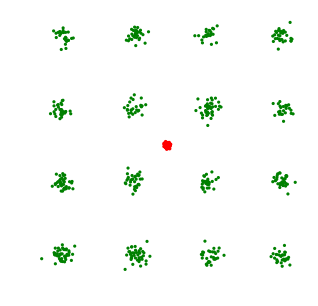

  0%|          | 100/80001 [00:01<43:07, 30.88it/s]  

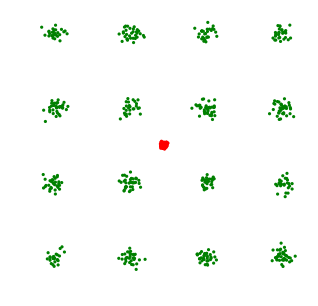

  0%|          | 196/80001 [00:03<20:37, 64.51it/s]

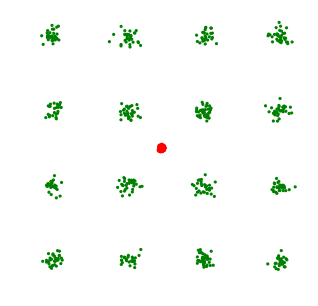

  0%|          | 294/80001 [00:04<20:19, 65.38it/s]

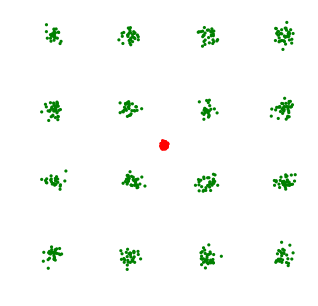

  0%|          | 394/80001 [00:06<15:13, 87.16it/s]

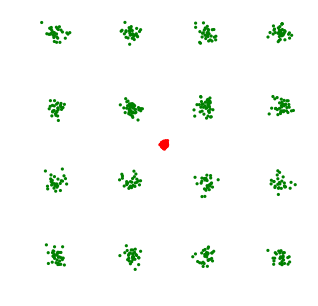

  1%|          | 498/80001 [00:07<15:00, 88.32it/s]

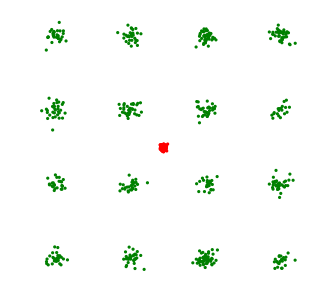

  1%|          | 595/80001 [00:08<14:45, 89.69it/s]

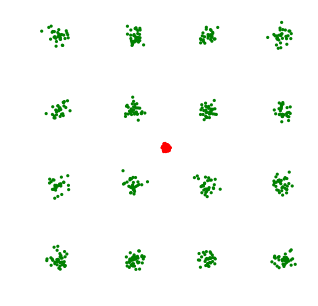

  1%|          | 695/80001 [00:09<19:42, 67.06it/s]

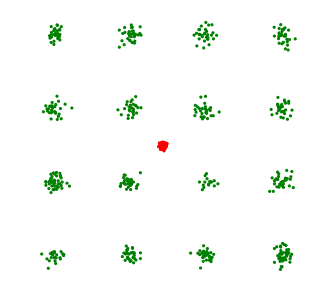

  1%|          | 800/80001 [00:11<21:00, 62.85it/s]

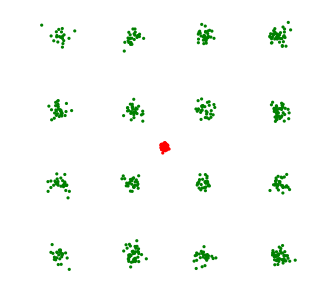

  1%|          | 893/80001 [00:12<14:58, 88.01it/s]

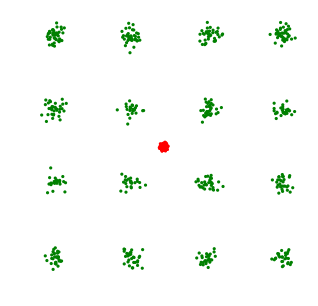

  1%|          | 1000/80001 [00:14<14:32, 90.56it/s]

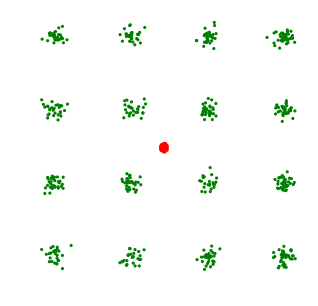

  1%|▏         | 1094/80001 [00:15<14:50, 88.58it/s]

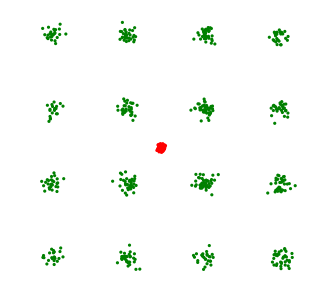

  1%|▏         | 1198/80001 [00:16<14:40, 89.47it/s]

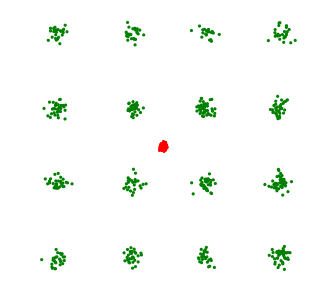

  2%|▏         | 1300/80001 [00:18<20:39, 63.47it/s]

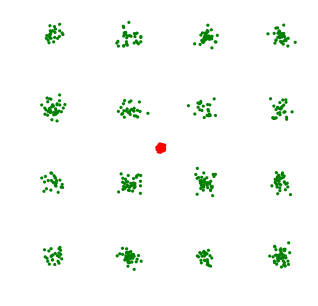

  2%|▏         | 1393/80001 [00:19<16:07, 81.25it/s]

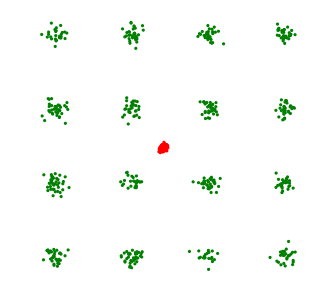

  2%|▏         | 1497/80001 [00:21<14:50, 88.12it/s]

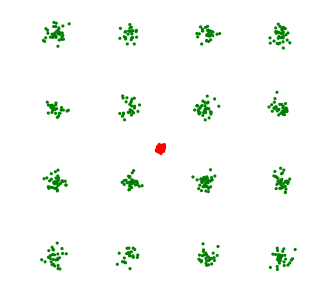

  2%|▏         | 1600/80001 [00:22<14:43, 88.75it/s]

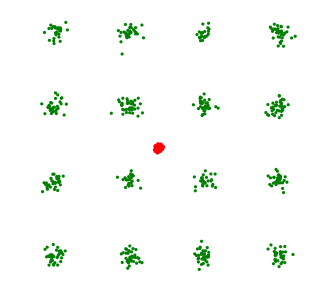

  2%|▏         | 1692/80001 [00:23<14:48, 88.18it/s]

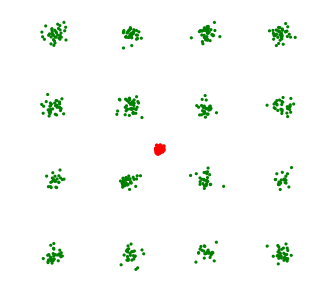

  2%|▏         | 1798/80001 [00:24<19:27, 66.99it/s]

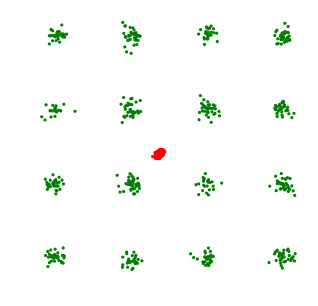

  2%|▏         | 1899/80001 [00:26<20:13, 64.37it/s]

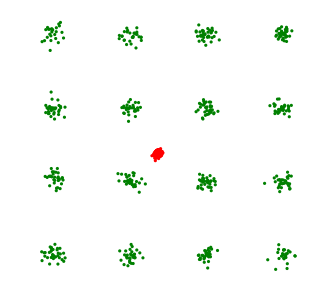

  2%|▏         | 1995/80001 [00:27<14:45, 88.13it/s]

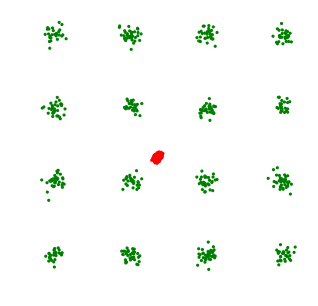

  3%|▎         | 2098/80001 [00:29<14:51, 87.40it/s]

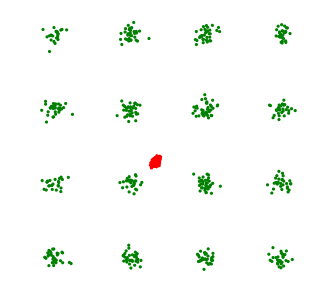

  3%|▎         | 2192/80001 [00:30<14:42, 88.19it/s]

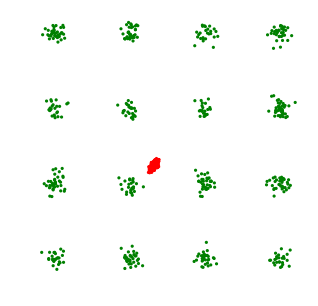

  3%|▎         | 2294/80001 [00:31<14:48, 87.43it/s]

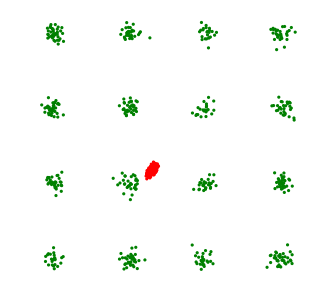

  3%|▎         | 2395/80001 [00:33<19:47, 65.35it/s]

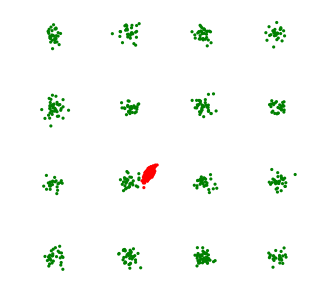

  3%|▎         | 2493/80001 [00:34<15:19, 84.34it/s]

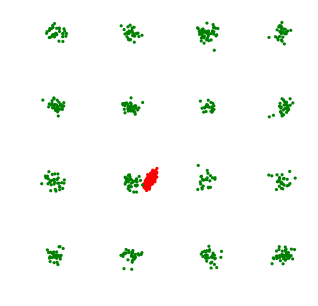

  3%|▎         | 2593/80001 [00:36<14:47, 87.20it/s]

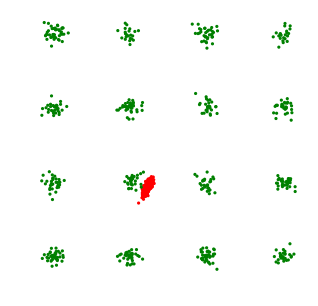

  3%|▎         | 2696/80001 [00:37<14:37, 88.09it/s]

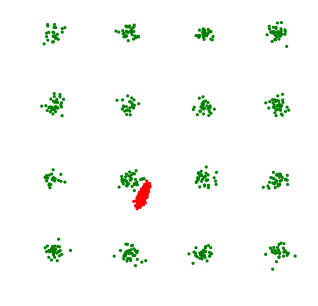

  3%|▎         | 2797/80001 [00:38<14:40, 87.65it/s]

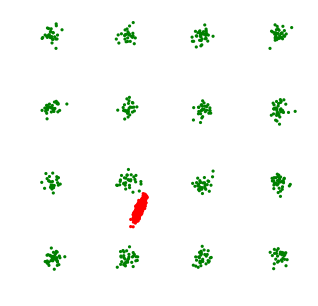

  4%|▎         | 2898/80001 [00:40<20:26, 62.85it/s]

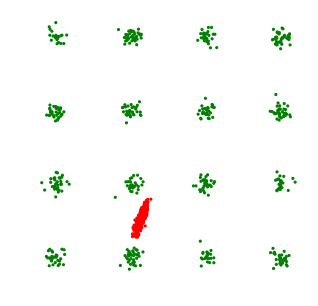

  4%|▎         | 2994/80001 [00:41<15:25, 83.21it/s]

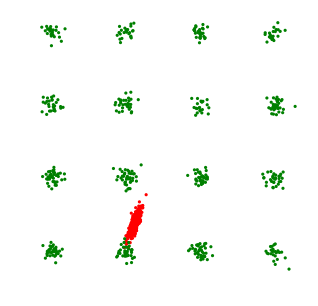

  4%|▍         | 3097/80001 [00:42<14:26, 88.78it/s]

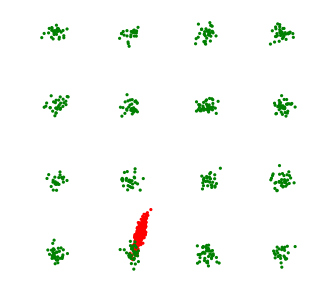

  4%|▍         | 3192/80001 [00:44<14:34, 87.82it/s]

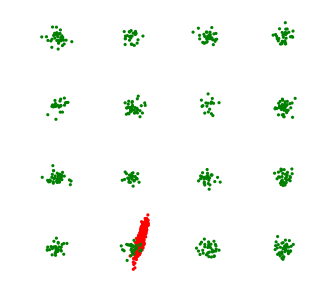

  4%|▍         | 3295/80001 [00:45<14:36, 87.54it/s]

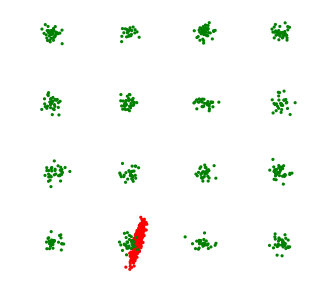

  4%|▍         | 3394/80001 [00:46<18:36, 68.63it/s]

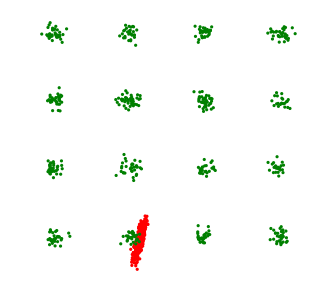

  4%|▍         | 3495/80001 [00:48<19:19, 65.99it/s]

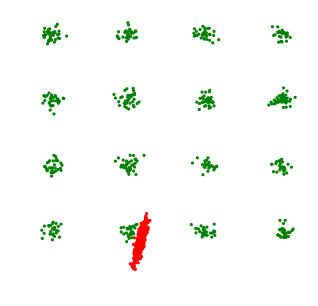

  4%|▍         | 3595/80001 [00:49<14:35, 87.29it/s]

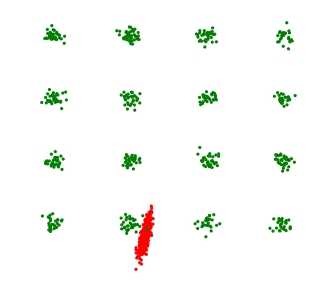

  5%|▍         | 3699/80001 [00:51<14:19, 88.80it/s]

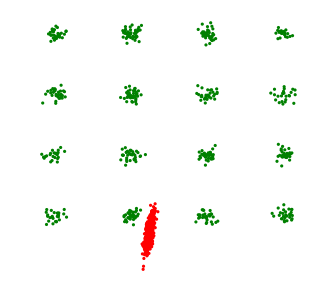

  5%|▍         | 3794/80001 [00:52<14:16, 88.94it/s]

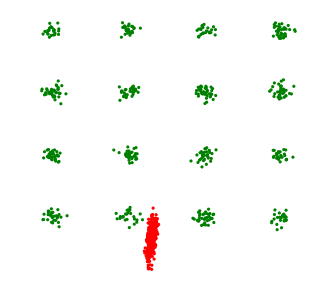

  5%|▍         | 3897/80001 [00:53<15:32, 81.60it/s]

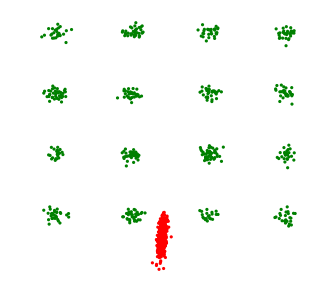

  5%|▍         | 3998/80001 [00:55<18:39, 67.89it/s]

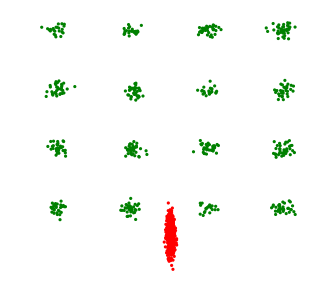

  5%|▌         | 4100/80001 [00:56<15:12, 83.22it/s]

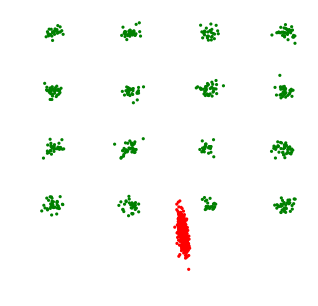

  5%|▌         | 4194/80001 [00:57<14:19, 88.15it/s]

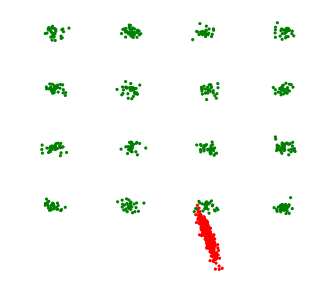

  5%|▌         | 4297/80001 [00:59<14:19, 88.05it/s]

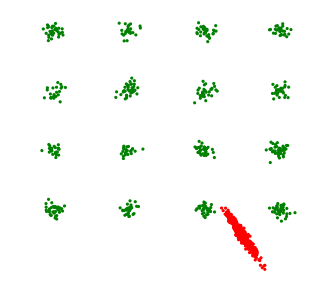

  5%|▌         | 4391/80001 [01:00<14:25, 87.35it/s]

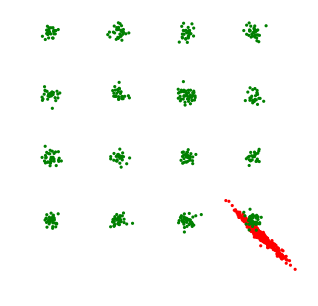

  6%|▌         | 4497/80001 [01:01<18:40, 67.36it/s]

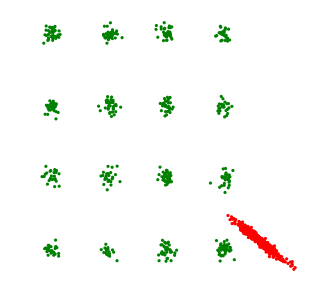

  6%|▌         | 4597/80001 [01:03<18:28, 68.00it/s]

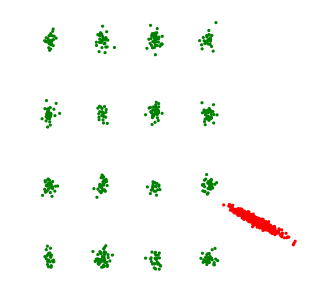

  6%|▌         | 4698/80001 [01:04<14:08, 88.72it/s]

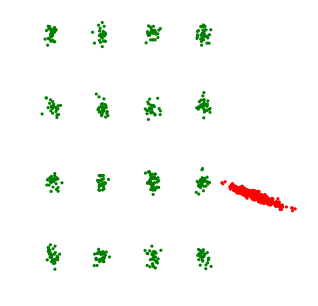

  6%|▌         | 4794/80001 [01:05<14:07, 88.73it/s]

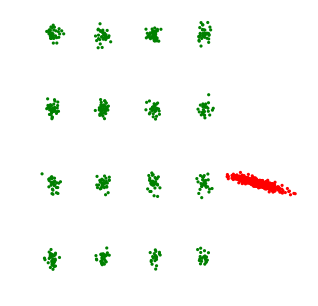

  6%|▌         | 4899/80001 [01:07<14:03, 89.06it/s]

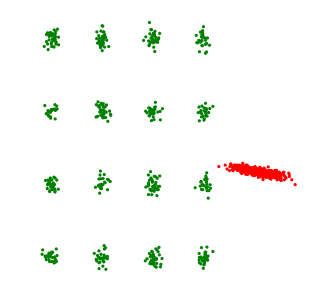

  6%|▌         | 4997/80001 [01:08<17:00, 73.52it/s]

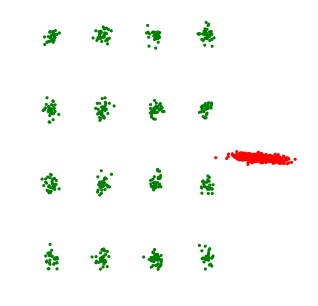

  6%|▋         | 5099/80001 [01:10<19:45, 63.16it/s]

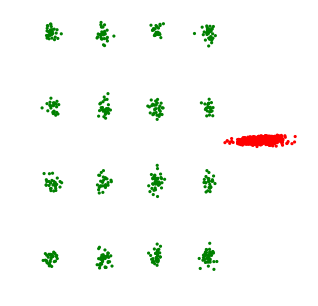

  6%|▋         | 5194/80001 [01:11<14:31, 85.84it/s]

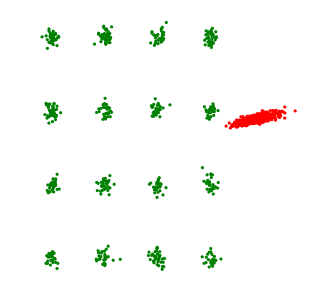

  7%|▋         | 5298/80001 [01:12<13:48, 90.13it/s]

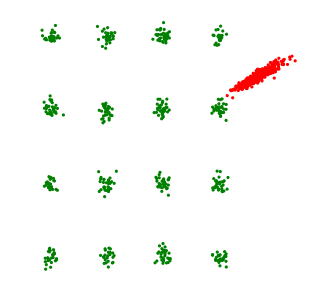

  7%|▋         | 5392/80001 [01:13<14:07, 88.08it/s]

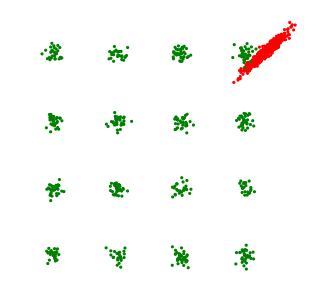

  7%|▋         | 5492/80001 [01:15<14:03, 88.31it/s]

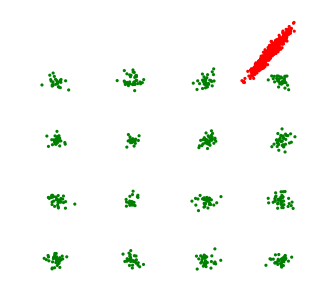

  7%|▋         | 5595/80001 [01:16<19:04, 64.99it/s]

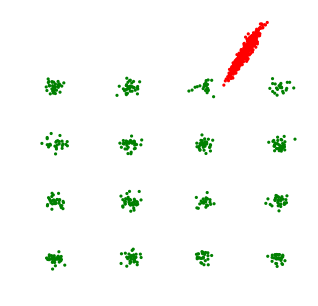

  7%|▋         | 5693/80001 [01:18<15:52, 78.00it/s]

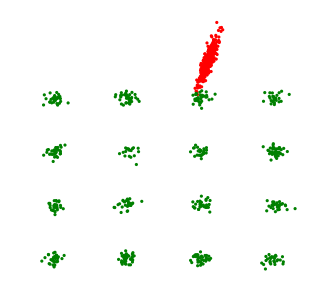

  7%|▋         | 5793/80001 [01:19<13:57, 88.63it/s]

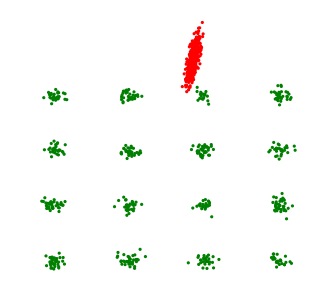

  7%|▋         | 5897/80001 [01:20<13:43, 89.95it/s]

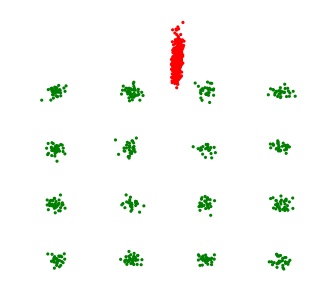

  7%|▋         | 6000/80001 [01:22<13:53, 88.77it/s]

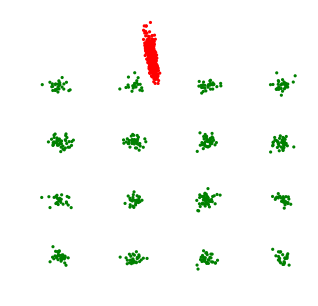

  8%|▊         | 6098/80001 [01:23<18:16, 67.40it/s]

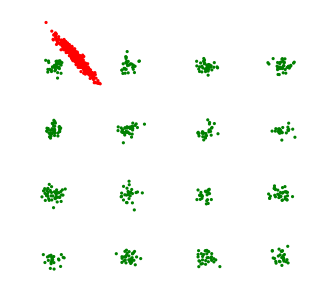

  8%|▊         | 6192/80001 [01:25<17:27, 70.48it/s]

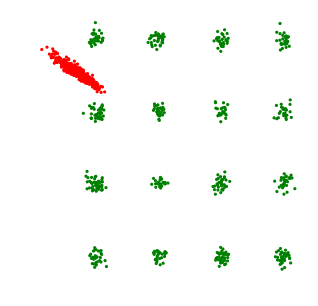

  8%|▊         | 6294/80001 [01:26<14:49, 82.83it/s]

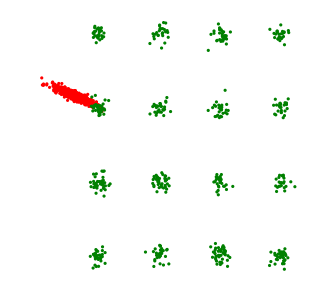

  8%|▊         | 6397/80001 [01:27<13:53, 88.32it/s]

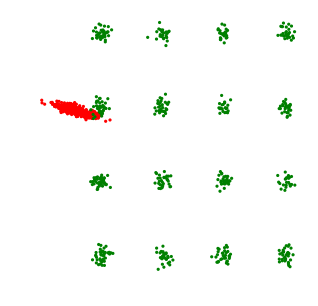

  8%|▊         | 6492/80001 [01:29<13:51, 88.45it/s]

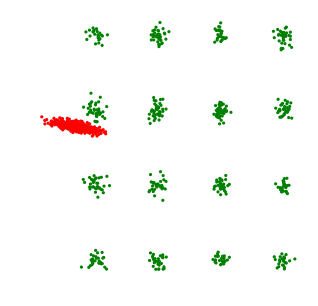

  8%|▊         | 6593/80001 [01:30<15:35, 78.48it/s]

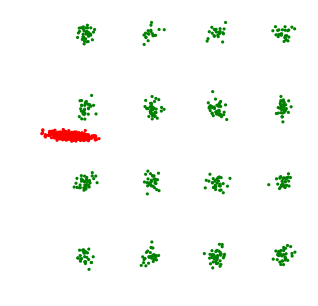

  8%|▊         | 6699/80001 [01:32<19:34, 62.40it/s]

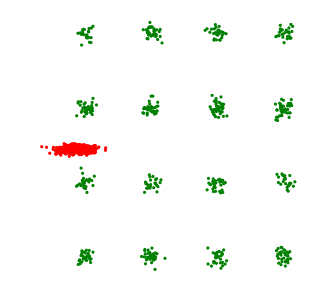

  8%|▊         | 6800/80001 [01:33<14:19, 85.15it/s]

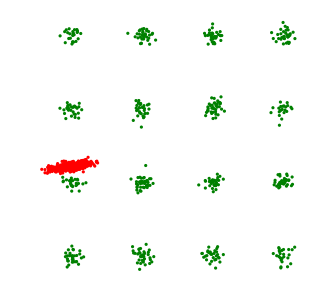

  9%|▊         | 6895/80001 [01:34<13:42, 88.89it/s]

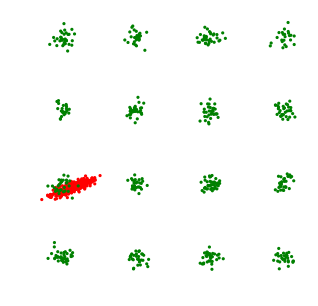

  9%|▊         | 6997/80001 [01:36<13:44, 88.56it/s]

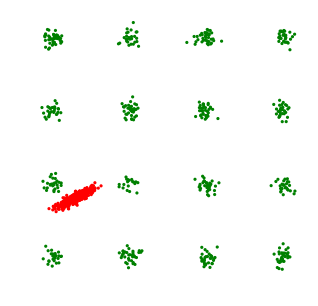

  9%|▉         | 7094/80001 [01:37<13:37, 89.14it/s]

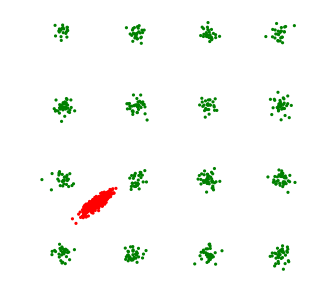

  9%|▉         | 7200/80001 [01:38<18:18, 66.28it/s]

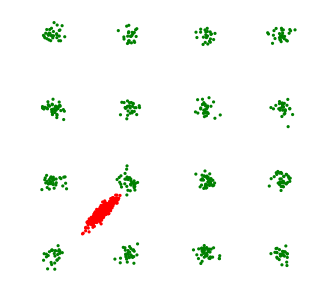

  9%|▉         | 7297/80001 [01:40<15:35, 77.76it/s]

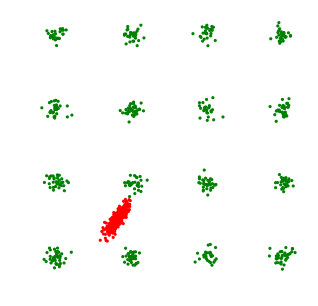

  9%|▉         | 7391/80001 [01:41<13:42, 88.30it/s]

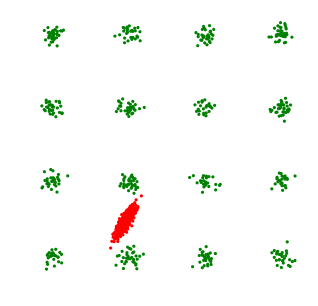

  9%|▉         | 7498/80001 [01:42<13:38, 88.57it/s]

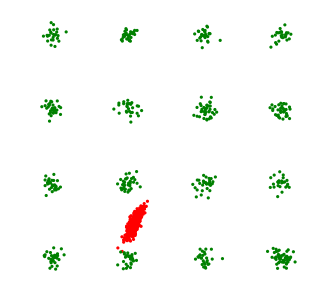

  9%|▉         | 7592/80001 [01:43<13:41, 88.15it/s]

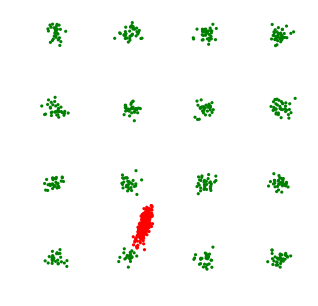

 10%|▉         | 7700/80001 [01:45<17:09, 70.21it/s]

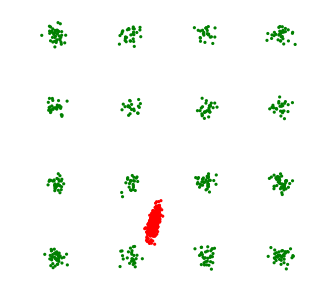

 10%|▉         | 7794/80001 [01:46<18:43, 64.27it/s]

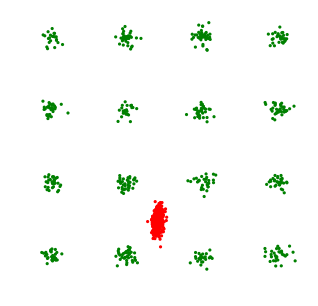

 10%|▉         | 7897/80001 [01:48<13:57, 86.10it/s]

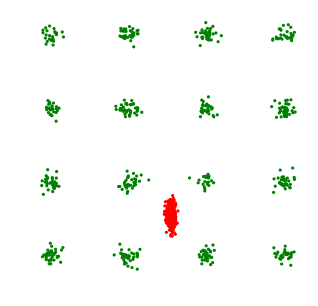

 10%|▉         | 7998/80001 [01:49<13:45, 87.23it/s]

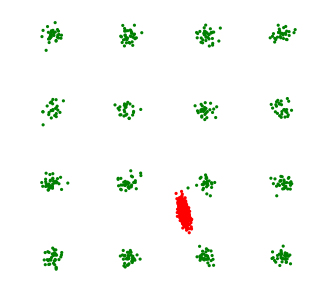

 10%|█         | 8094/80001 [01:50<13:36, 88.02it/s]

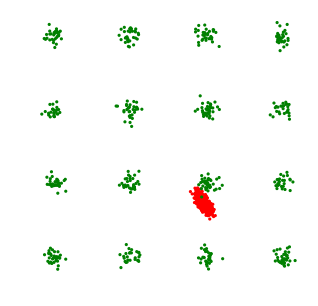

 10%|█         | 8197/80001 [01:52<13:28, 88.78it/s]

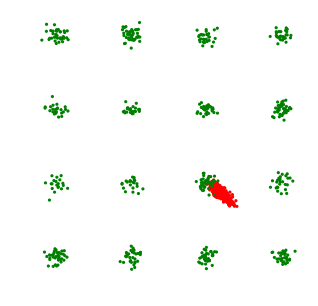

 10%|█         | 8300/80001 [01:53<18:34, 64.34it/s]

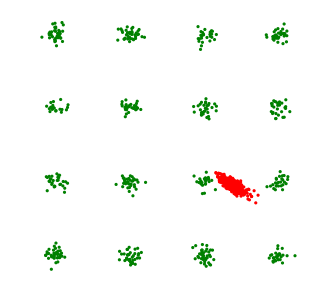

 10%|█         | 8394/80001 [01:55<14:49, 80.46it/s]

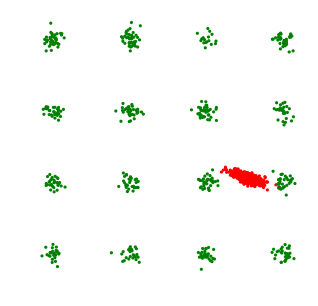

 11%|█         | 8498/80001 [01:56<13:20, 89.36it/s]

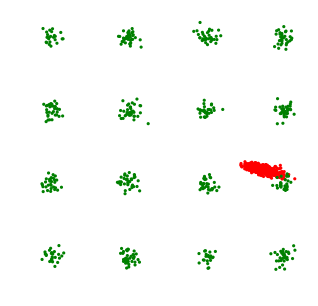

 11%|█         | 8594/80001 [01:57<13:24, 88.76it/s]

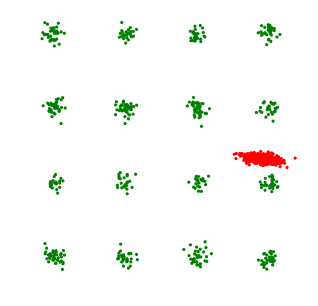

 11%|█         | 8697/80001 [01:58<13:28, 88.21it/s]

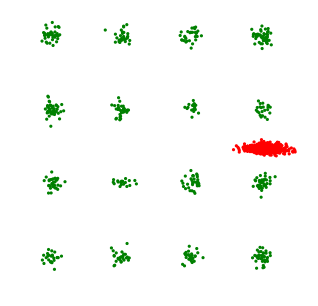

 11%|█         | 8794/80001 [02:00<17:37, 67.35it/s]

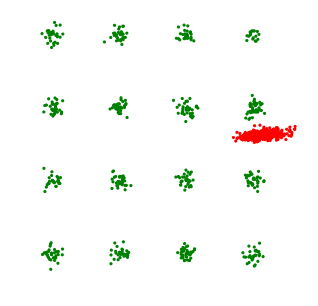

 11%|█         | 8900/80001 [02:02<18:04, 65.55it/s]

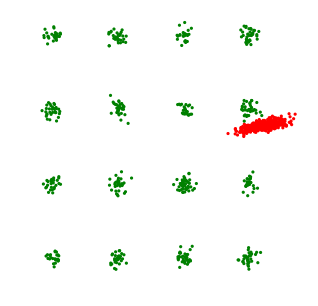

 11%|█         | 9000/80001 [02:03<13:36, 86.91it/s]

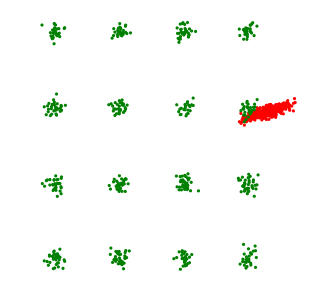

 11%|█▏        | 9097/80001 [02:04<12:54, 91.53it/s]

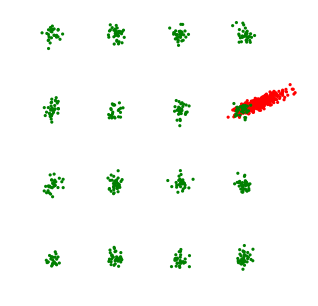

 11%|█▏        | 9193/80001 [02:05<13:28, 87.59it/s]

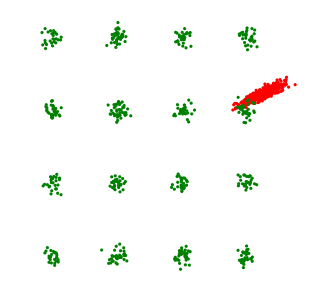

 12%|█▏        | 9295/80001 [02:06<14:25, 81.66it/s]

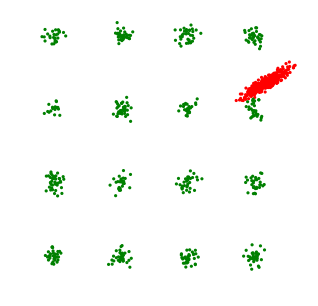

 12%|█▏        | 9397/80001 [02:08<17:16, 68.13it/s]

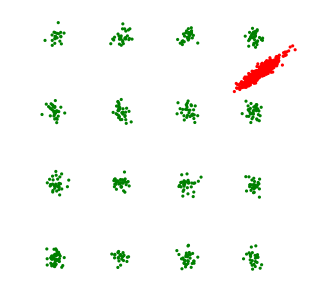

 12%|█▏        | 9494/80001 [02:10<14:04, 83.51it/s]

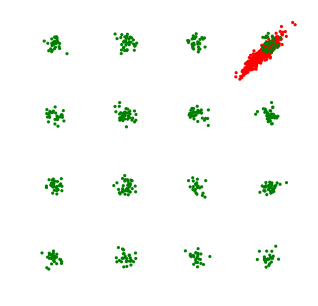

 12%|█▏        | 9597/80001 [02:11<13:10, 89.03it/s]

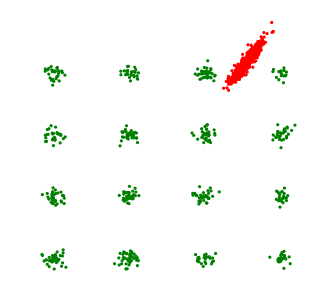

 12%|█▏        | 9698/80001 [02:12<13:27, 87.05it/s]

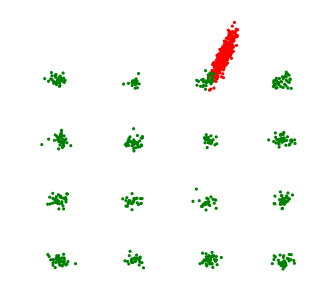

 12%|█▏        | 9800/80001 [02:13<13:10, 88.83it/s]

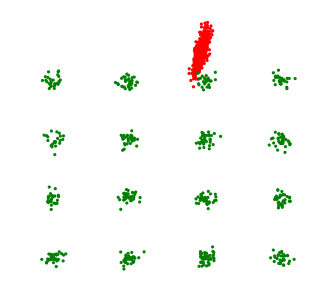

 12%|█▏        | 9895/80001 [02:15<17:14, 67.77it/s]

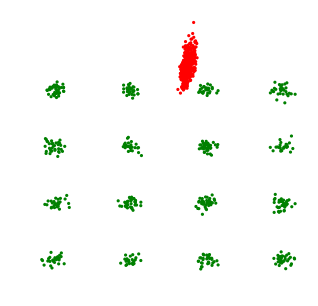

 12%|█▏        | 10000/80001 [02:17<15:24, 75.72it/s]

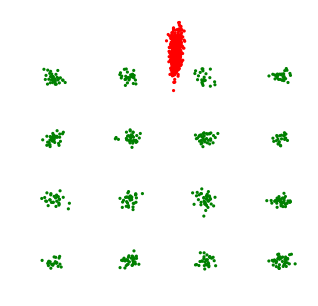

 13%|█▎        | 10100/80001 [02:18<13:13, 88.15it/s]

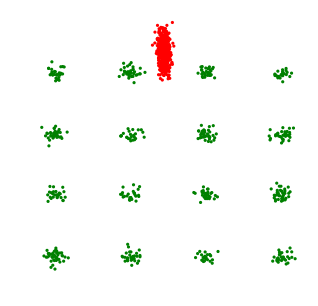

 13%|█▎        | 10193/80001 [02:19<13:07, 88.63it/s]

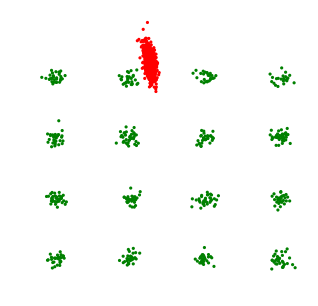

 13%|█▎        | 10297/80001 [02:20<12:54, 89.99it/s]

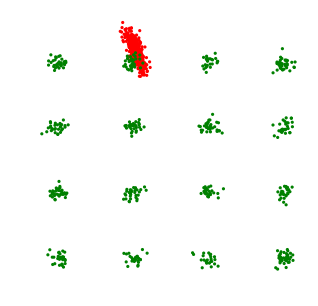

 13%|█▎        | 10396/80001 [02:22<16:14, 71.46it/s]

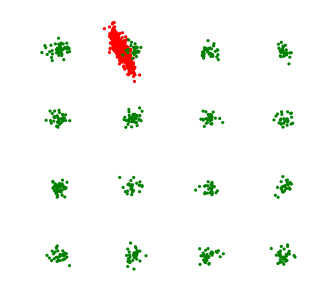

 13%|█▎        | 10500/80001 [02:23<16:50, 68.79it/s]

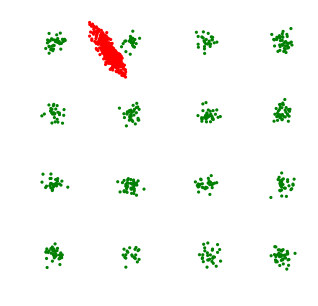

 13%|█▎        | 10595/80001 [02:25<13:22, 86.47it/s]

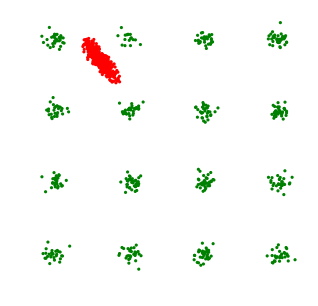

 13%|█▎        | 10699/80001 [02:26<12:54, 89.48it/s]

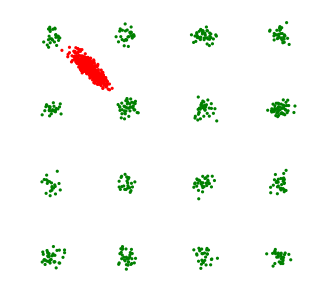

 13%|█▎        | 10791/80001 [02:27<13:07, 87.94it/s]

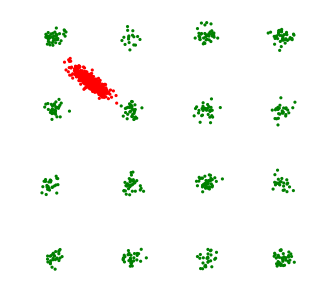

 14%|█▎        | 10894/80001 [02:28<12:53, 89.31it/s]

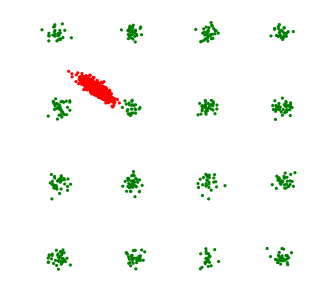

 14%|█▎        | 10999/80001 [02:30<17:08, 67.08it/s]

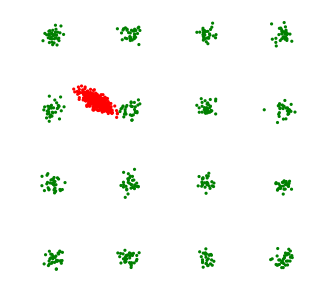

 14%|█▍        | 11098/80001 [02:31<16:58, 67.65it/s]

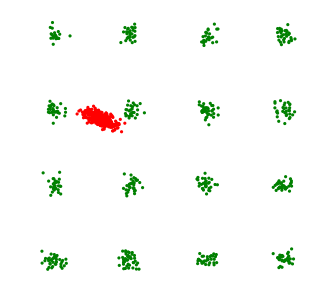

 14%|█▍        | 11200/80001 [02:33<13:02, 87.96it/s]

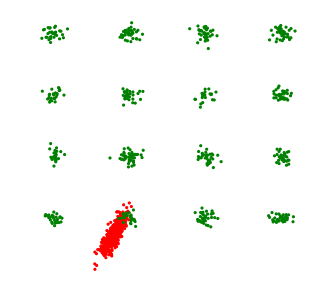

 14%|█▍        | 11299/80001 [02:34<12:48, 89.34it/s]

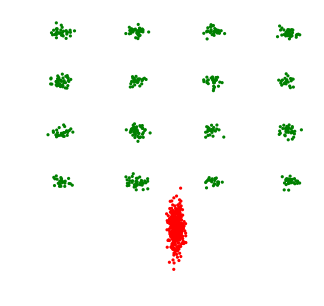

 14%|█▍        | 11396/80001 [02:35<12:53, 88.75it/s]

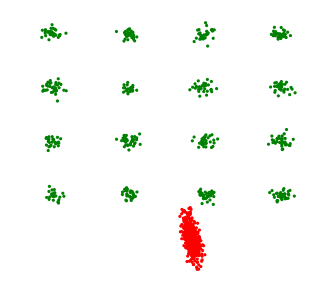

 14%|█▍        | 11496/80001 [02:36<15:42, 72.70it/s]

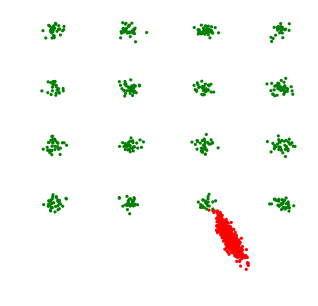

 14%|█▍        | 11598/80001 [02:38<16:30, 69.08it/s]

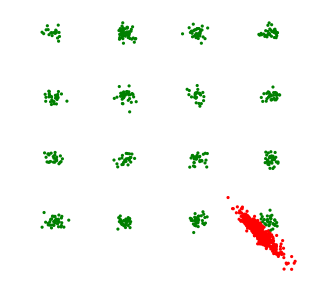

 15%|█▍        | 11692/80001 [02:39<13:11, 86.28it/s]

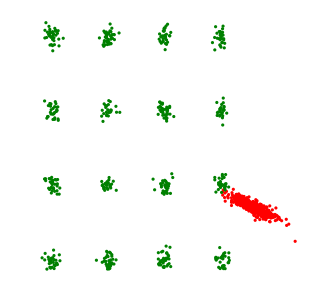

 15%|█▍        | 11799/80001 [02:41<12:40, 89.72it/s]

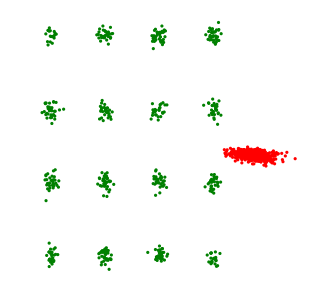

 15%|█▍        | 11894/80001 [02:42<12:56, 87.74it/s]

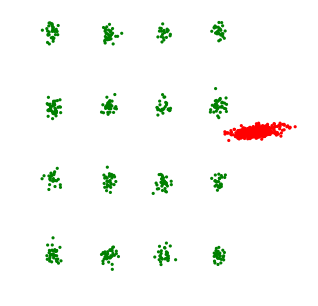

 15%|█▍        | 11998/80001 [02:43<12:44, 89.01it/s]

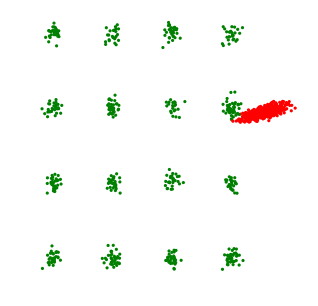

 15%|█▌        | 12096/80001 [02:45<16:44, 67.59it/s]

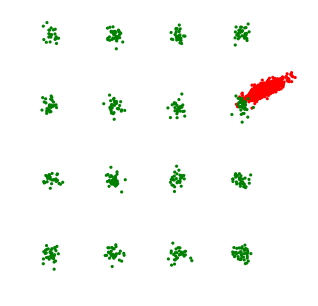

 15%|█▌        | 12199/80001 [02:46<14:38, 77.21it/s]

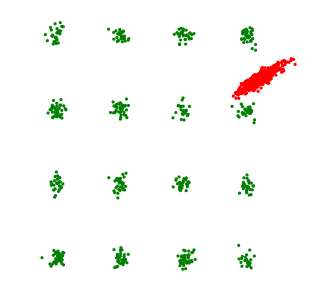

 15%|█▌        | 12299/80001 [02:48<12:55, 87.34it/s]

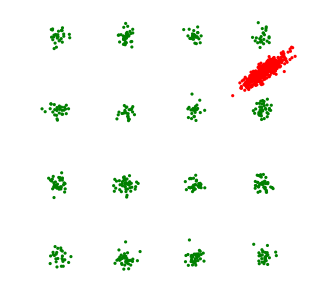

 15%|█▌        | 12395/80001 [02:49<12:33, 89.76it/s]

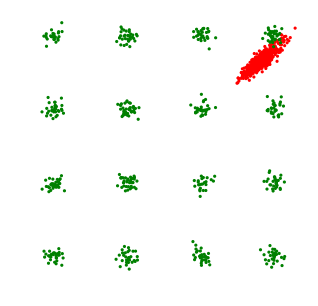

 16%|█▌        | 12500/80001 [02:50<12:40, 88.77it/s]

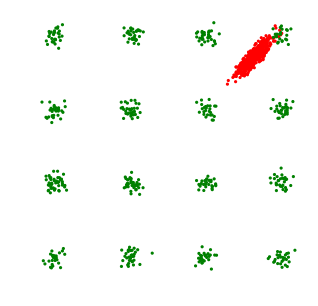

 16%|█▌        | 12596/80001 [02:51<15:47, 71.13it/s]

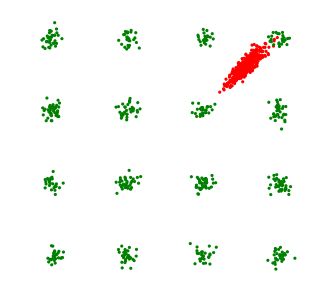

 16%|█▌        | 12697/80001 [02:53<16:36, 67.54it/s]

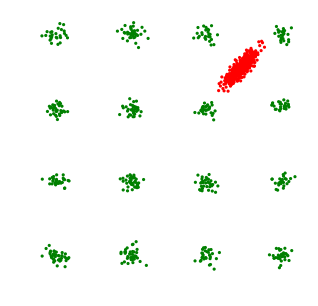

 16%|█▌        | 12792/80001 [02:54<13:02, 85.92it/s]

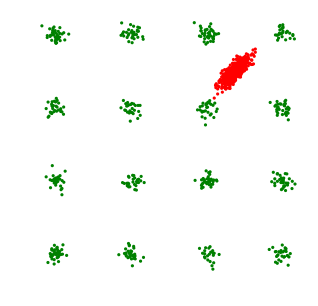

 16%|█▌        | 12895/80001 [02:55<12:35, 88.77it/s]

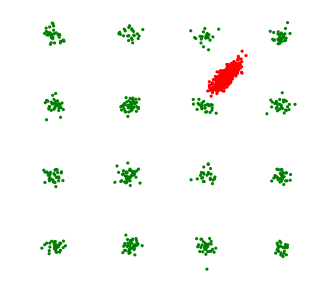

 16%|█▌        | 12998/80001 [02:57<12:47, 87.32it/s]

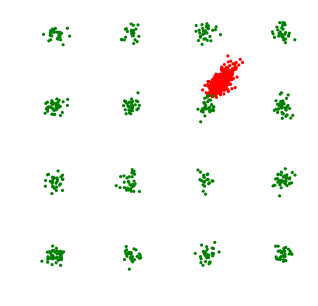

 16%|█▋        | 13094/80001 [02:58<12:29, 89.24it/s]

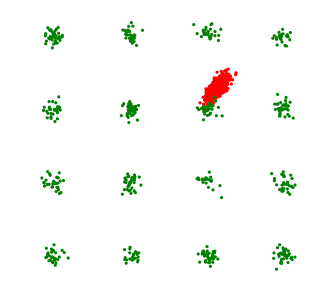

 16%|█▋        | 13196/80001 [03:00<16:00, 69.57it/s]

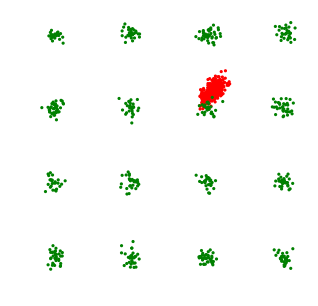

 17%|█▋        | 13295/80001 [03:01<14:21, 77.40it/s]

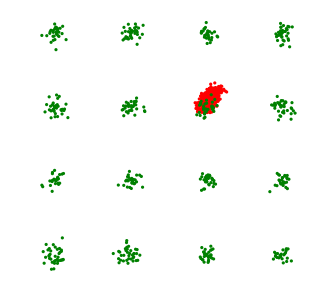

 17%|█▋        | 13397/80001 [03:02<12:30, 88.69it/s]

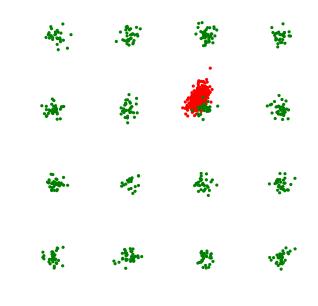

 17%|█▋        | 13493/80001 [03:03<12:27, 88.96it/s]

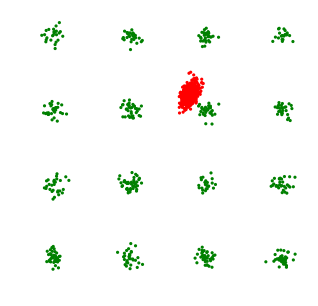

 17%|█▋        | 13599/80001 [03:05<12:20, 89.64it/s]

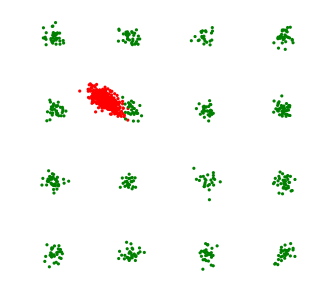

 17%|█▋        | 13696/80001 [03:06<15:41, 70.41it/s]

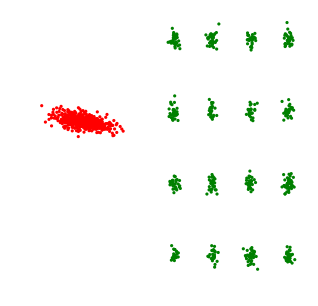

 17%|█▋        | 13795/80001 [03:08<16:55, 65.21it/s]

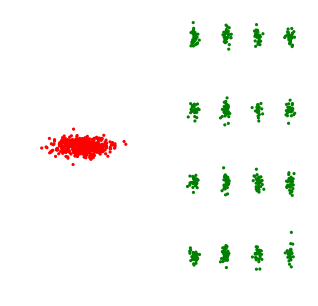

 17%|█▋        | 13899/80001 [03:09<12:31, 87.97it/s]

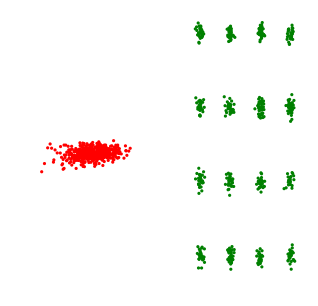

 17%|█▋        | 13994/80001 [03:10<12:21, 88.98it/s]

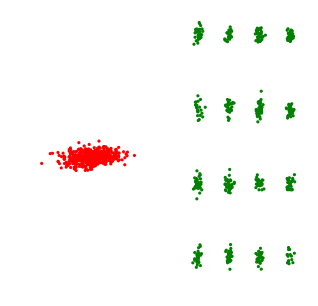

 18%|█▊        | 14097/80001 [03:12<12:25, 88.40it/s]

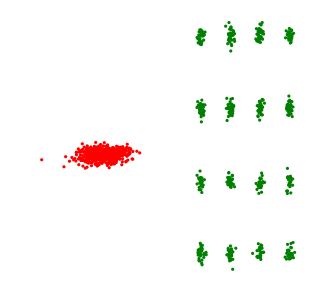

 18%|█▊        | 14192/80001 [03:13<13:26, 81.61it/s]

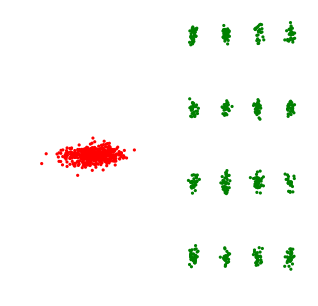

 18%|█▊        | 14294/80001 [03:14<15:34, 70.33it/s]

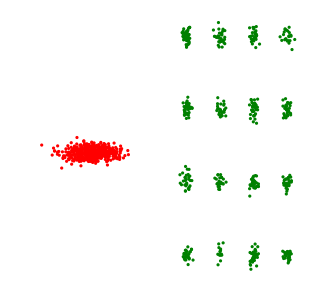

 18%|█▊        | 14398/80001 [03:16<13:01, 83.95it/s]

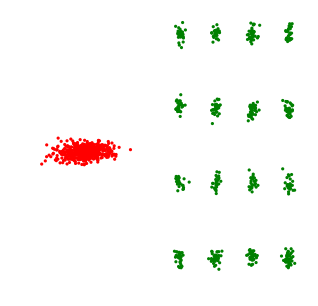

 18%|█▊        | 14494/80001 [03:17<12:22, 88.21it/s]

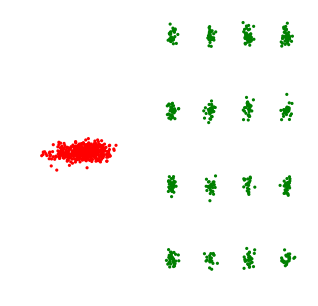

 18%|█▊        | 14591/80001 [03:18<12:15, 88.97it/s]

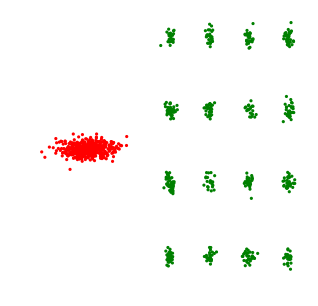

 18%|█▊        | 14694/80001 [03:20<12:16, 88.73it/s]

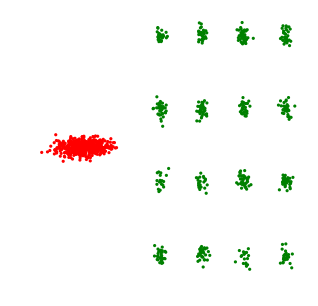

 18%|█▊        | 14797/80001 [03:21<15:51, 68.52it/s]

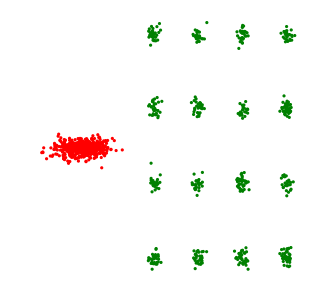

 19%|█▊        | 14899/80001 [03:23<15:48, 68.67it/s]

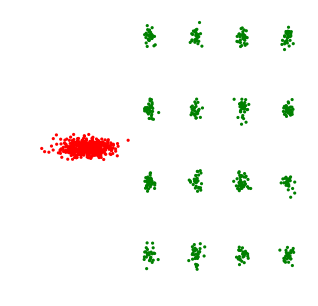

 19%|█▊        | 15000/80001 [03:24<12:18, 88.05it/s]

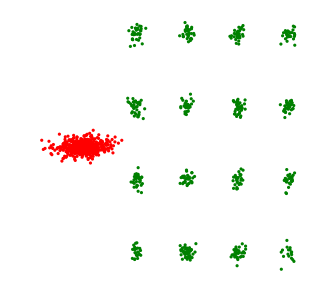

 19%|█▉        | 15094/80001 [03:25<12:27, 86.86it/s]

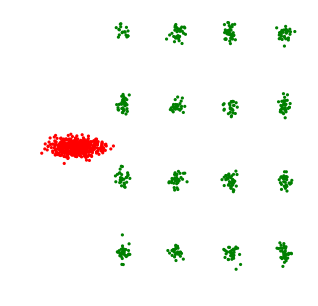

 19%|█▉        | 15196/80001 [03:26<12:09, 88.88it/s]

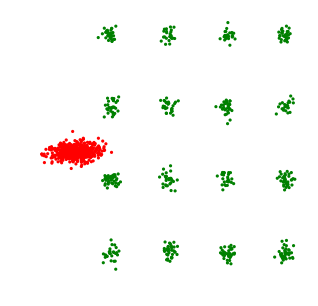

 19%|█▉        | 15298/80001 [03:28<12:25, 86.84it/s]

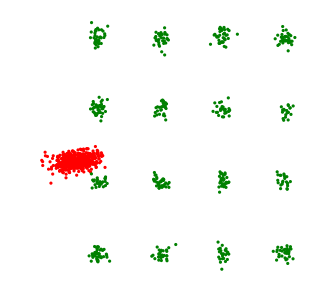

 19%|█▉        | 15393/80001 [03:29<15:22, 70.00it/s]

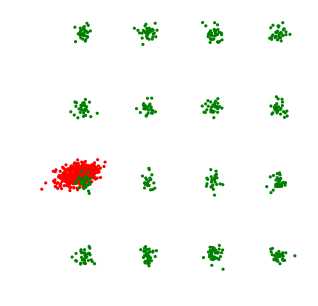

 19%|█▉        | 15493/80001 [03:31<13:50, 77.72it/s]

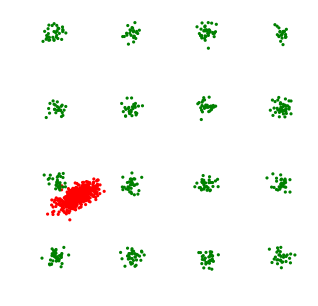

 19%|█▉        | 15598/80001 [03:32<12:02, 89.12it/s]

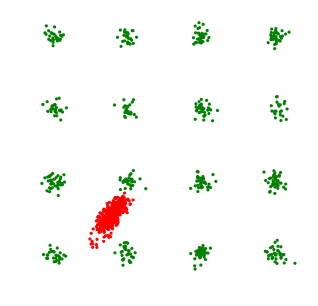

 20%|█▉        | 15693/80001 [03:33<12:07, 88.40it/s]

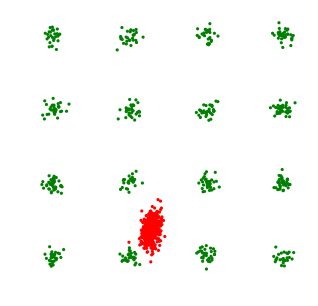

 20%|█▉        | 15798/80001 [03:35<12:52, 83.16it/s]

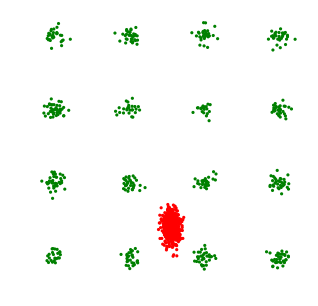

 20%|█▉        | 15900/80001 [03:36<15:22, 69.52it/s]

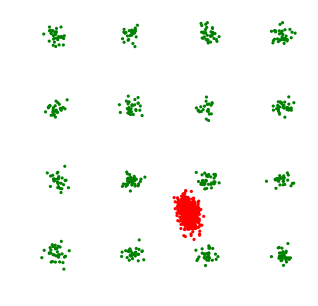

 20%|█▉        | 15995/80001 [03:38<16:06, 66.20it/s]

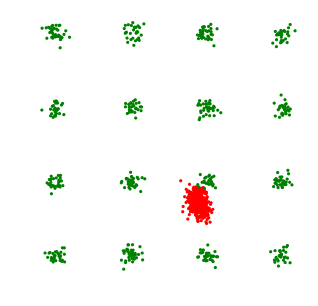

 20%|██        | 16095/80001 [03:39<12:10, 87.43it/s]

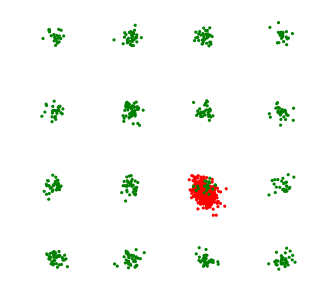

 20%|██        | 16198/80001 [03:40<12:03, 88.19it/s]

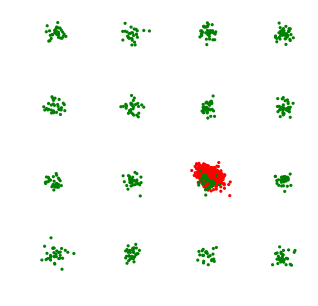

 20%|██        | 16294/80001 [03:41<11:55, 89.02it/s]

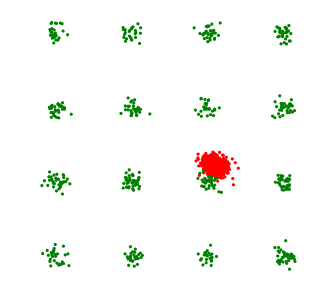

 20%|██        | 16395/80001 [03:43<11:58, 88.48it/s]

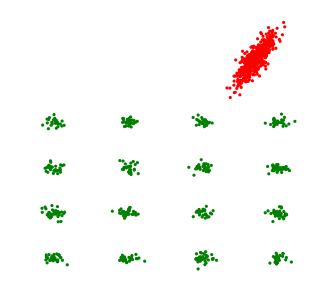

 21%|██        | 16495/80001 [03:44<16:20, 64.78it/s]

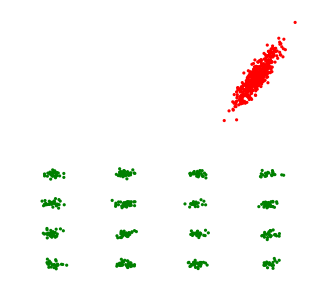

 21%|██        | 16593/80001 [03:46<13:41, 77.14it/s]

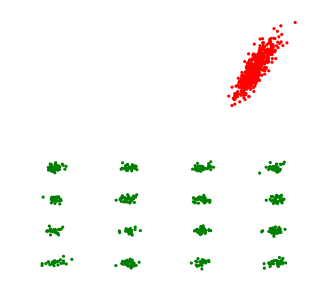

 21%|██        | 16691/80001 [03:47<11:39, 90.52it/s]

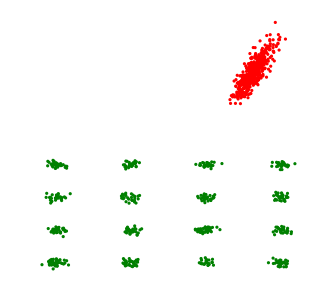

 21%|██        | 16797/80001 [03:48<11:48, 89.27it/s]

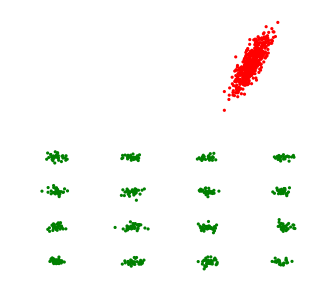

 21%|██        | 16900/80001 [03:49<11:50, 88.78it/s]

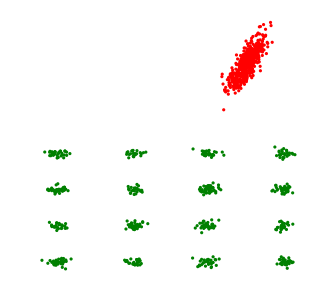

 21%|██        | 16994/80001 [03:51<15:57, 65.78it/s]

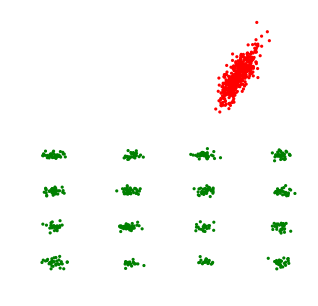

 21%|██▏       | 17094/80001 [03:52<15:35, 67.26it/s]

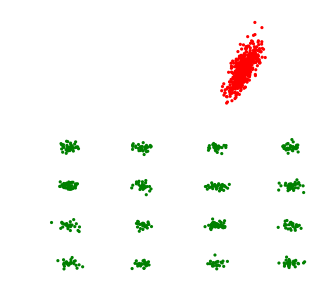

 21%|██▏       | 17195/80001 [03:54<11:56, 87.63it/s]

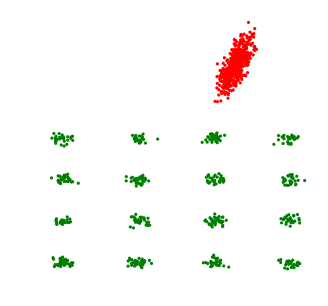

 22%|██▏       | 17297/80001 [03:55<11:55, 87.66it/s]

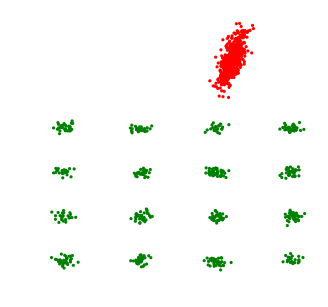

 22%|██▏       | 17392/80001 [03:56<11:43, 89.01it/s]

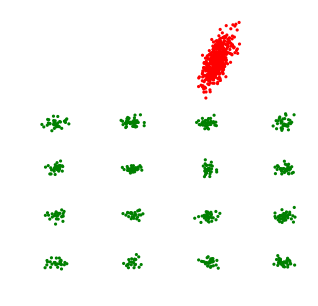

 22%|██▏       | 17497/80001 [03:57<11:35, 89.92it/s]

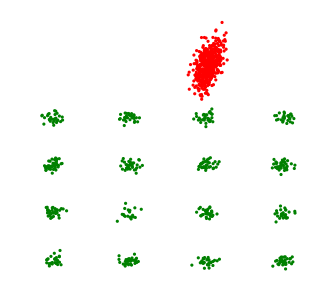

 22%|██▏       | 17594/80001 [03:59<15:46, 65.95it/s]

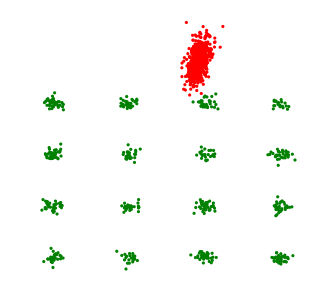

 22%|██▏       | 17698/80001 [04:01<12:13, 84.99it/s]

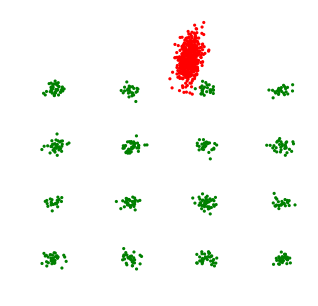

 22%|██▏       | 17796/80001 [04:02<11:37, 89.17it/s]

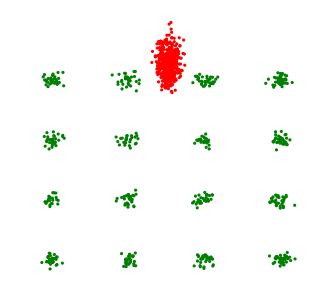

 22%|██▏       | 17899/80001 [04:03<11:39, 88.78it/s]

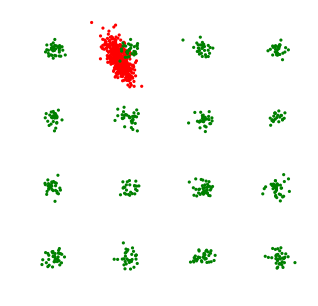

 22%|██▏       | 17993/80001 [04:04<11:33, 89.45it/s]

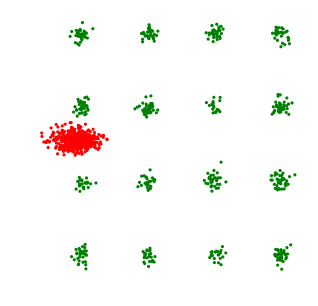

 23%|██▎       | 18093/80001 [04:06<14:39, 70.42it/s]

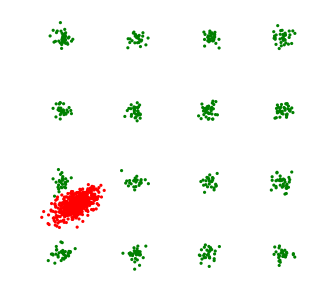

 23%|██▎       | 18199/80001 [04:07<15:04, 68.31it/s]

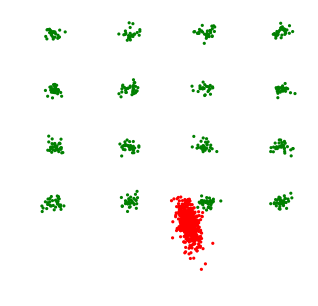

 23%|██▎       | 18294/80001 [04:09<11:59, 85.78it/s]

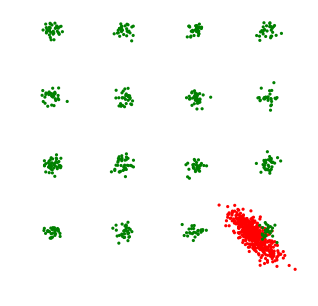

 23%|██▎       | 18398/80001 [04:10<11:31, 89.05it/s]

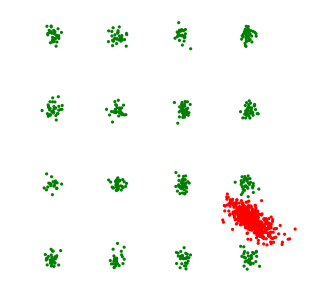

 23%|██▎       | 18493/80001 [04:11<11:34, 88.50it/s]

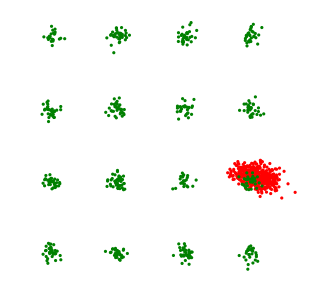

 23%|██▎       | 18597/80001 [04:12<11:20, 90.29it/s]

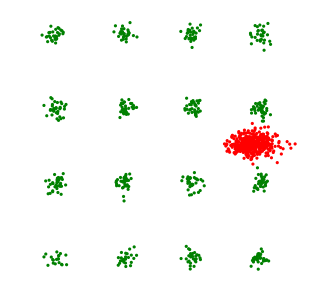

 23%|██▎       | 18699/80001 [04:14<15:05, 67.66it/s]

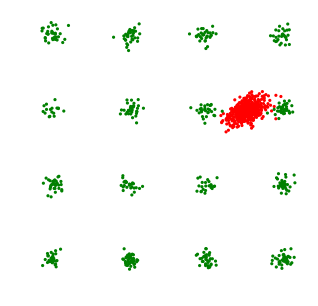

 23%|██▎       | 18795/80001 [04:15<14:56, 68.28it/s]

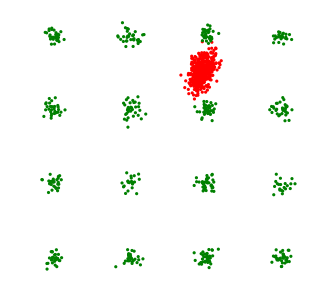

 24%|██▎       | 18899/80001 [04:17<11:32, 88.26it/s]

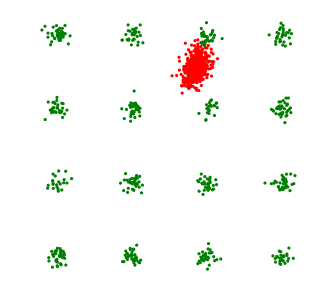

 24%|██▎       | 18999/80001 [04:18<11:32, 88.10it/s]

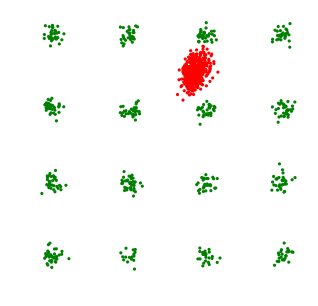

 24%|██▍       | 19092/80001 [04:19<11:30, 88.18it/s]

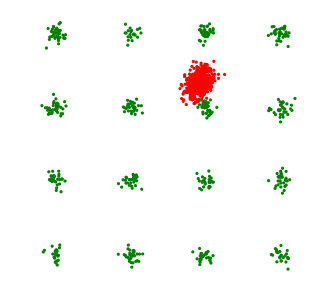

 24%|██▍       | 19195/80001 [04:20<13:20, 75.92it/s]

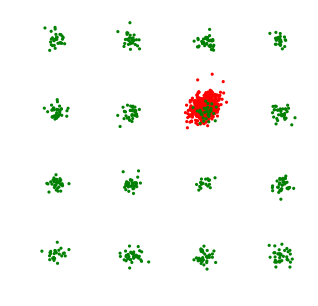

 24%|██▍       | 19297/80001 [04:22<14:47, 68.37it/s]

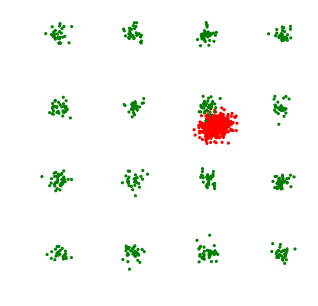

 24%|██▍       | 19395/80001 [04:23<12:06, 83.46it/s]

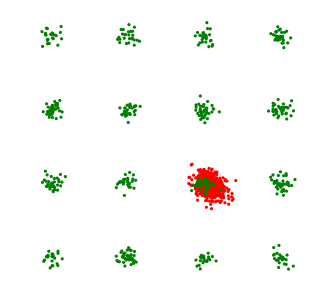

 24%|██▍       | 19499/80001 [04:25<11:28, 87.86it/s]

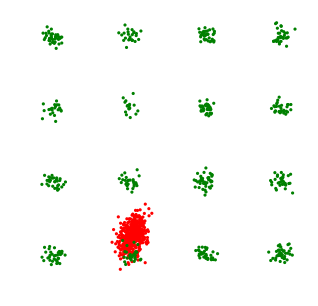

 24%|██▍       | 19595/80001 [04:26<11:19, 88.95it/s]

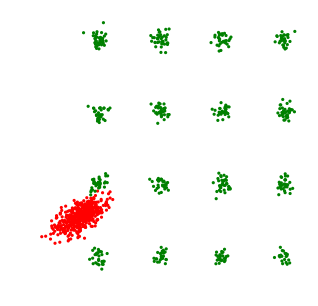

 25%|██▍       | 19699/80001 [04:27<11:14, 89.36it/s]

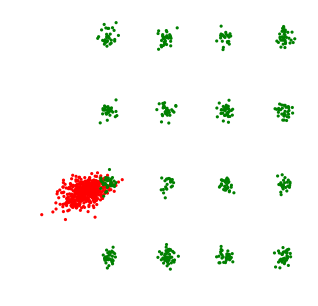

 25%|██▍       | 19795/80001 [04:28<11:12, 89.48it/s]

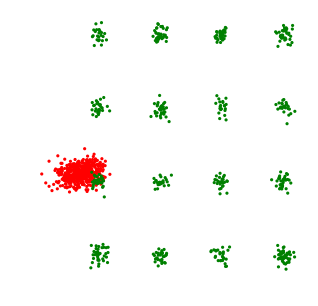

 25%|██▍       | 19893/80001 [04:30<11:15, 88.96it/s]

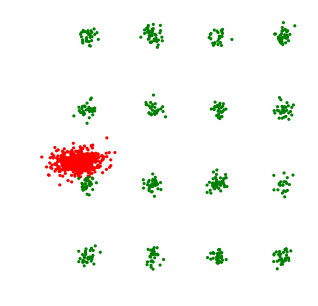

 25%|██▍       | 19992/80001 [04:31<11:09, 89.60it/s]

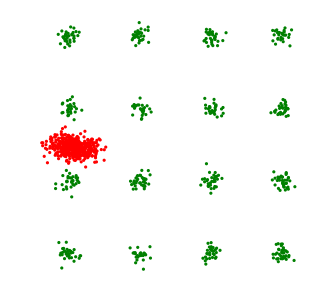

 25%|██▌       | 20097/80001 [04:32<11:11, 89.17it/s]

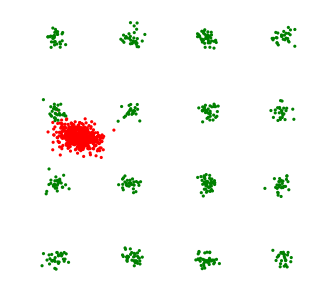

 25%|██▌       | 20193/80001 [04:33<11:16, 88.46it/s]

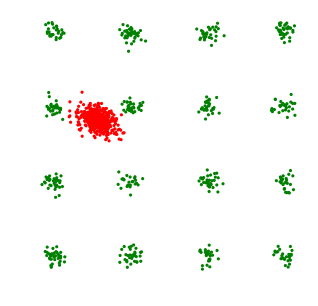

 25%|██▌       | 20297/80001 [04:35<11:12, 88.82it/s]

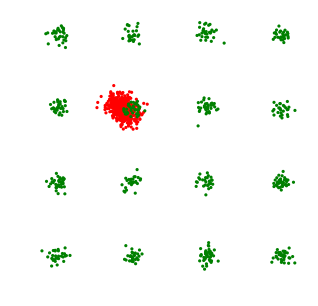

 25%|██▌       | 20394/80001 [04:36<11:06, 89.47it/s]

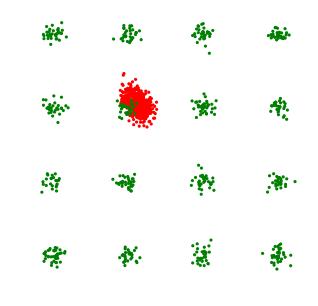

 26%|██▌       | 20491/80001 [04:37<11:07, 89.16it/s]

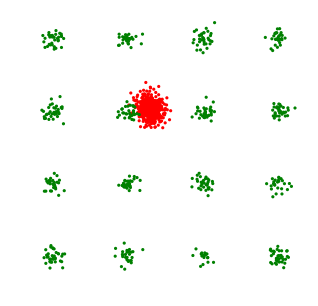

 26%|██▌       | 20597/80001 [04:38<11:02, 89.71it/s]

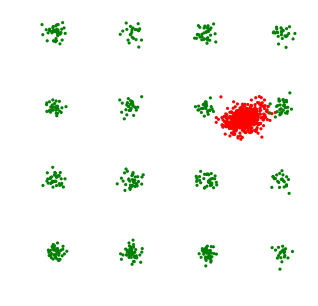

 26%|██▌       | 20699/80001 [04:39<11:09, 88.61it/s]

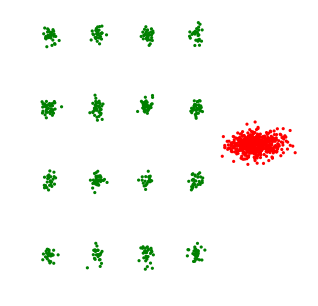

 26%|██▌       | 20794/80001 [04:41<11:00, 89.61it/s]

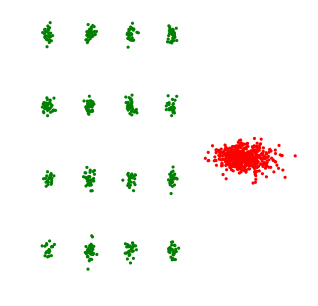

 26%|██▌       | 20898/80001 [04:42<11:04, 88.93it/s]

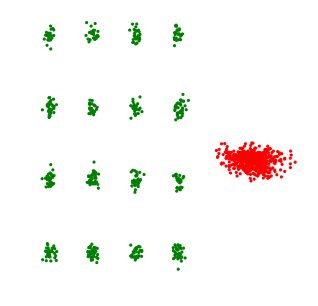

 26%|██▌       | 20992/80001 [04:43<11:08, 88.23it/s]

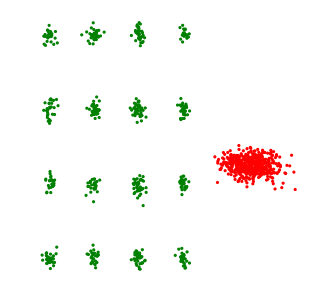

 26%|██▋       | 21093/80001 [04:44<11:05, 88.52it/s]

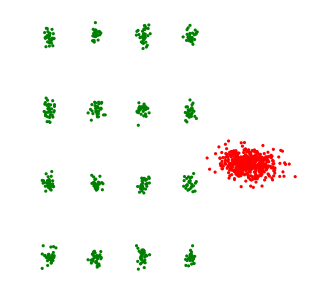

 26%|██▋       | 21196/80001 [04:46<11:00, 89.09it/s]

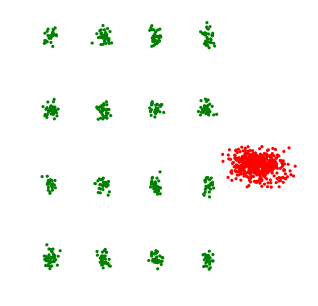

 27%|██▋       | 21293/80001 [04:47<10:58, 89.20it/s]

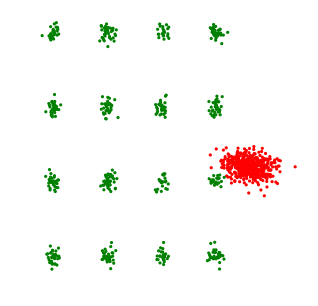

 27%|██▋       | 21398/80001 [04:48<11:07, 87.82it/s]

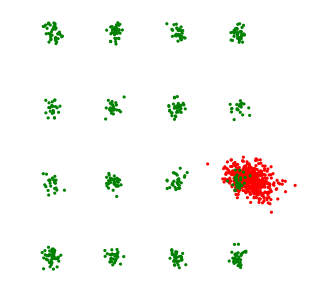

 27%|██▋       | 21492/80001 [04:49<11:16, 86.53it/s]

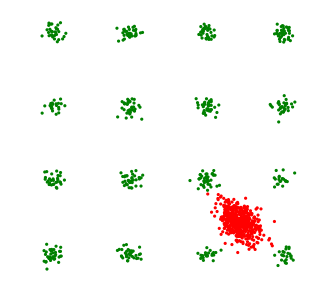

 27%|██▋       | 21597/80001 [04:51<10:55, 89.14it/s]

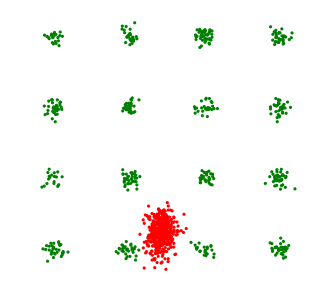

 27%|██▋       | 21700/80001 [04:52<10:55, 88.88it/s]

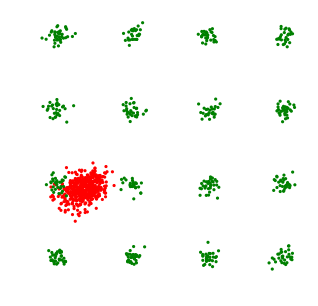

 27%|██▋       | 21795/80001 [04:53<10:56, 88.65it/s]

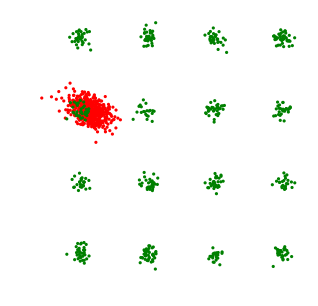

 27%|██▋       | 21898/80001 [04:54<10:50, 89.36it/s]

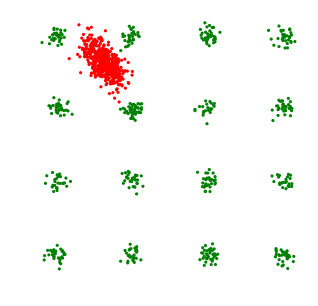

 27%|██▋       | 21994/80001 [04:56<10:50, 89.15it/s]

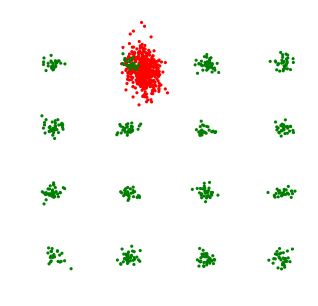

 28%|██▊       | 22099/80001 [04:57<10:44, 89.82it/s]

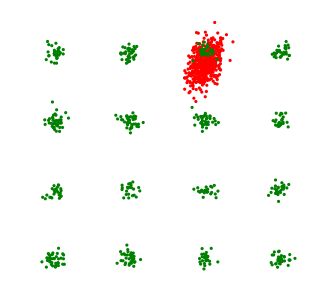

 28%|██▊       | 22192/80001 [04:58<10:51, 88.78it/s]

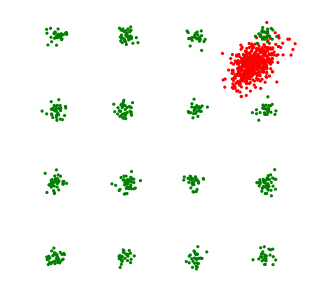

 28%|██▊       | 22293/80001 [04:59<10:46, 89.24it/s]

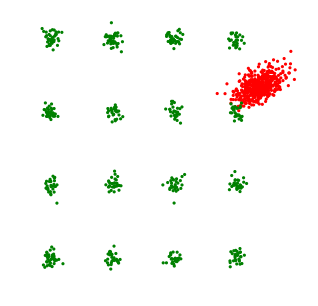

 28%|██▊       | 22397/80001 [05:00<10:46, 89.13it/s]

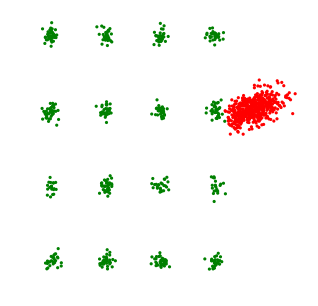

 28%|██▊       | 22491/80001 [05:02<10:48, 88.68it/s]

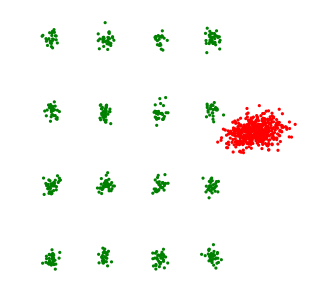

 28%|██▊       | 22593/80001 [05:03<10:55, 87.57it/s]

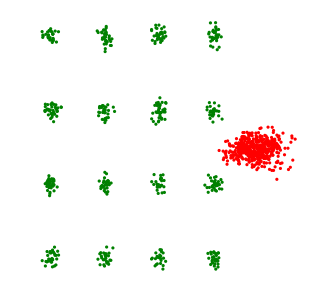

 28%|██▊       | 22696/80001 [05:04<10:36, 89.99it/s]

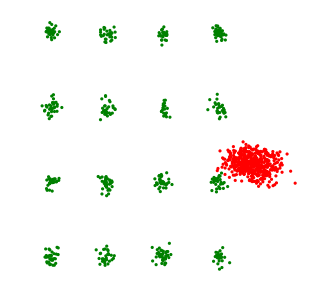

 28%|██▊       | 22795/80001 [05:05<10:37, 89.78it/s]

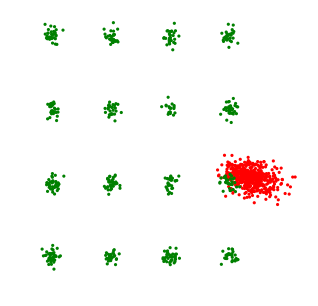

 29%|██▊       | 22899/80001 [05:07<10:46, 88.37it/s]

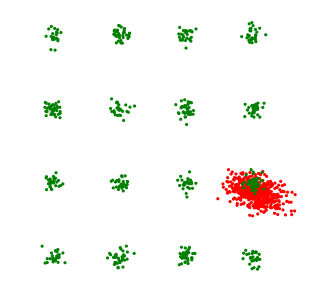

 29%|██▊       | 22992/80001 [05:08<11:02, 86.06it/s]

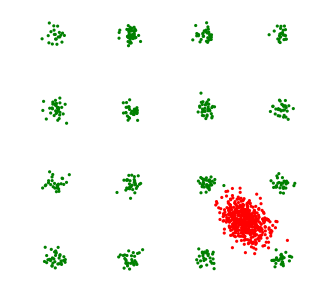

 29%|██▉       | 23098/80001 [05:09<10:35, 89.48it/s]

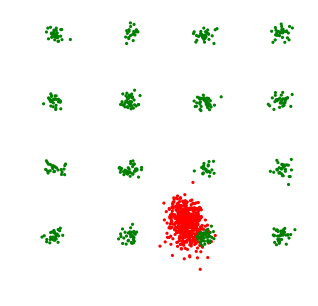

 29%|██▉       | 23192/80001 [05:10<10:47, 87.70it/s]

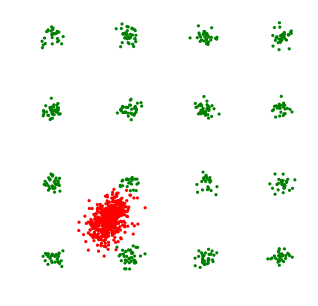

 29%|██▉       | 23295/80001 [05:12<10:43, 88.18it/s]

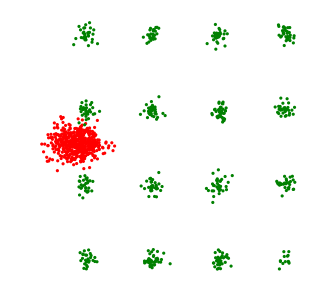

 29%|██▉       | 23399/80001 [05:13<10:37, 88.85it/s]

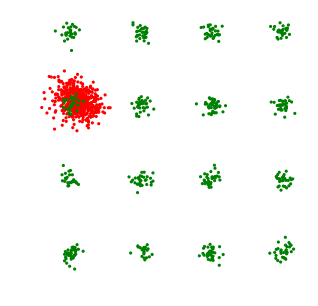

 29%|██▉       | 23491/80001 [05:14<10:41, 88.10it/s]

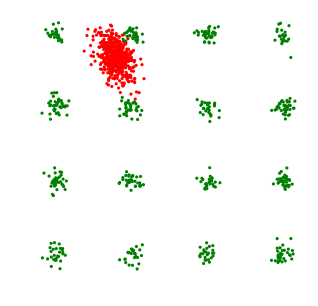

 29%|██▉       | 23598/80001 [05:15<10:39, 88.25it/s]

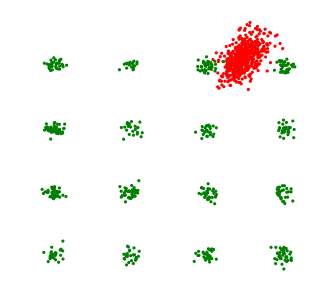

 30%|██▉       | 23695/80001 [05:16<10:32, 88.96it/s]

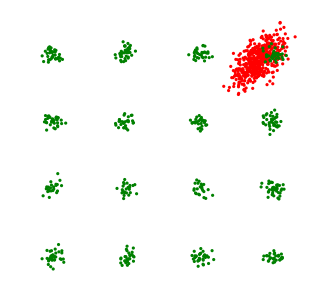

 30%|██▉       | 23795/80001 [05:18<10:39, 87.93it/s]

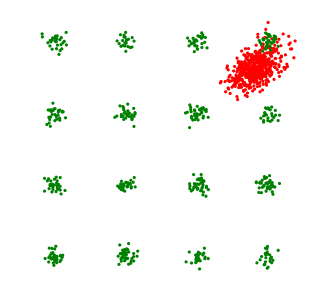

 30%|██▉       | 23896/80001 [05:19<10:36, 88.16it/s]

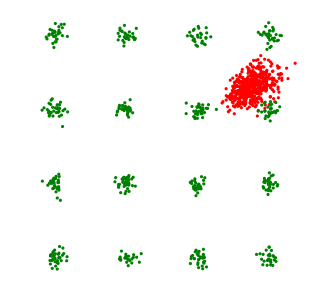

 30%|██▉       | 24000/80001 [05:20<10:27, 89.19it/s]

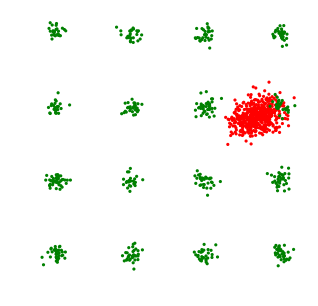

 30%|███       | 24095/80001 [05:21<10:39, 87.38it/s]

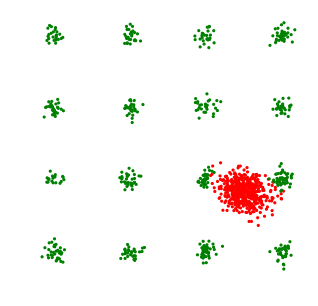

 30%|███       | 24196/80001 [05:23<10:31, 88.31it/s]

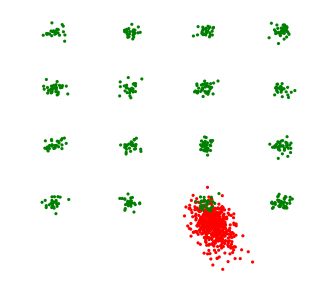

 30%|███       | 24298/80001 [05:24<10:37, 87.33it/s]

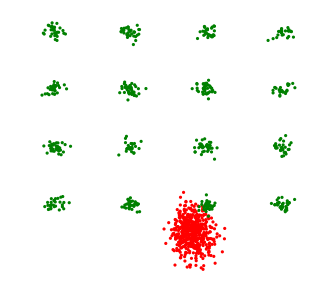

 30%|███       | 24394/80001 [05:25<10:27, 88.56it/s]

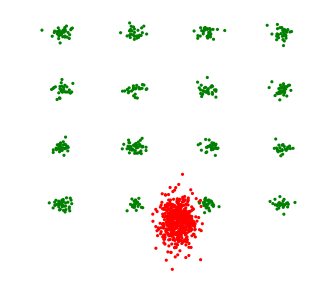

 31%|███       | 24495/80001 [05:26<10:26, 88.65it/s]

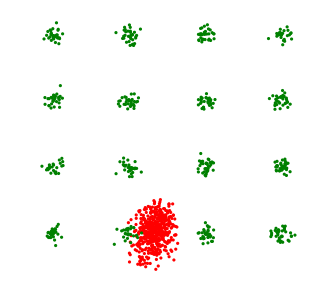

 31%|███       | 24596/80001 [05:28<10:26, 88.40it/s]

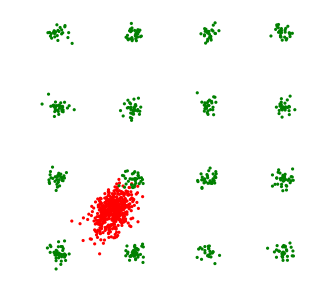

 31%|███       | 24692/80001 [05:29<10:17, 89.51it/s]

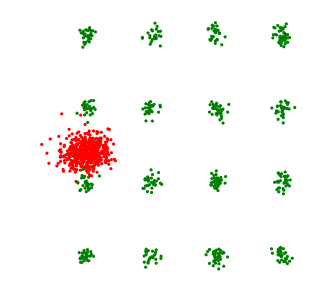

 31%|███       | 24800/80001 [05:30<10:16, 89.61it/s]

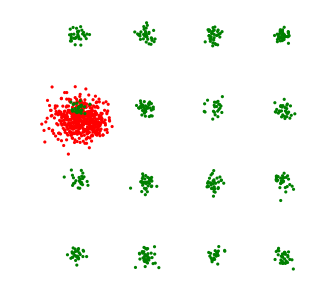

 31%|███       | 24896/80001 [05:31<10:16, 89.34it/s]

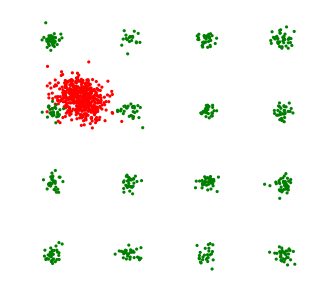

 31%|███       | 24998/80001 [05:33<10:22, 88.33it/s]

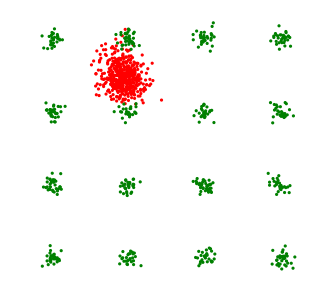

 31%|███▏      | 25100/80001 [05:34<10:30, 87.13it/s]

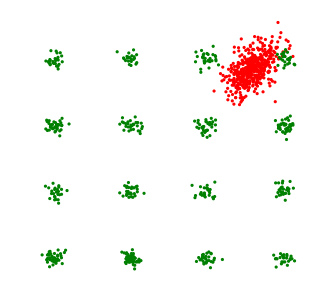

 31%|███▏      | 25200/80001 [05:35<10:22, 88.01it/s]

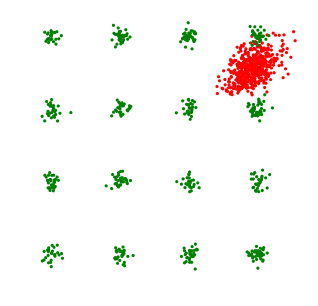

 32%|███▏      | 25294/80001 [05:36<10:20, 88.20it/s]

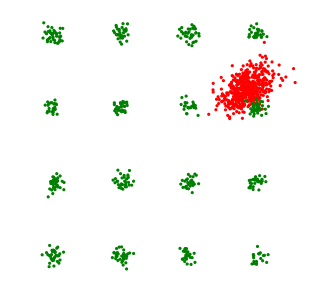

 32%|███▏      | 25397/80001 [05:37<10:18, 88.33it/s]

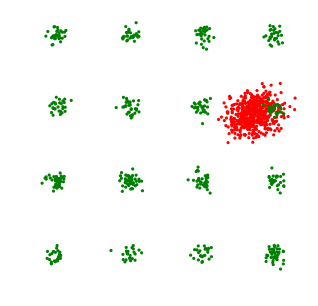

 32%|███▏      | 25500/80001 [05:39<10:24, 87.28it/s]

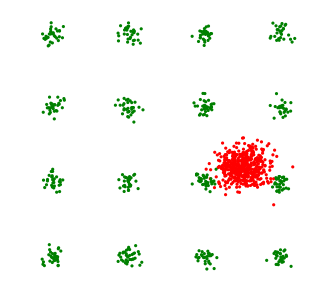

 32%|███▏      | 25596/80001 [05:40<10:05, 89.89it/s]

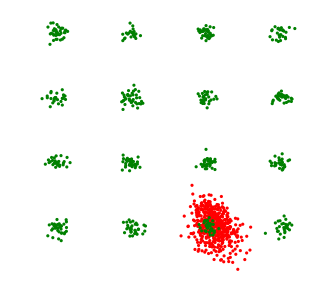

 32%|███▏      | 25699/80001 [05:41<10:14, 88.43it/s]

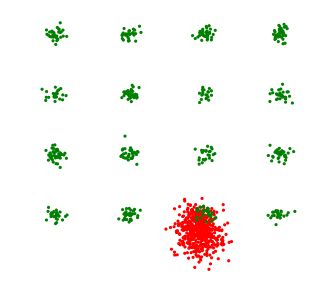

 32%|███▏      | 25800/80001 [05:43<10:13, 88.33it/s]

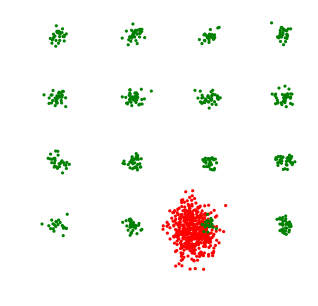

 32%|███▏      | 25897/80001 [05:44<10:08, 88.94it/s]

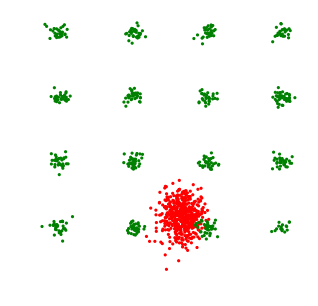

 32%|███▏      | 25993/80001 [05:45<10:02, 89.60it/s]

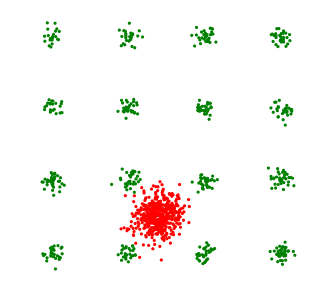

 33%|███▎      | 26098/80001 [05:46<10:09, 88.50it/s]

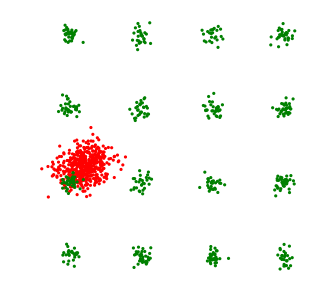

 33%|███▎      | 26193/80001 [05:47<10:12, 87.92it/s]

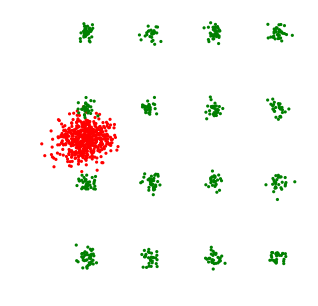

 33%|███▎      | 26295/80001 [05:49<10:06, 88.51it/s]

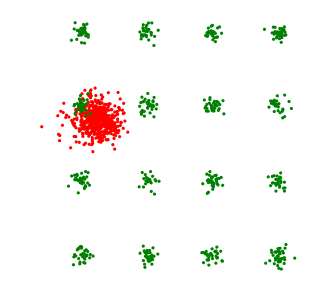

 33%|███▎      | 26391/80001 [05:50<10:05, 88.57it/s]

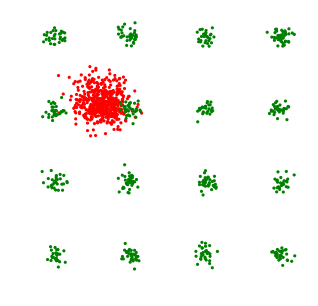

 33%|███▎      | 26498/80001 [05:51<10:05, 88.41it/s]

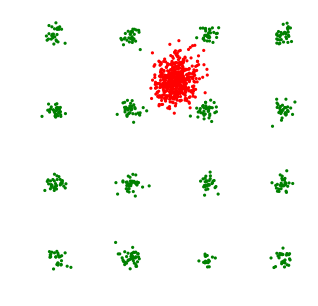

 33%|███▎      | 26592/80001 [05:52<10:02, 88.65it/s]

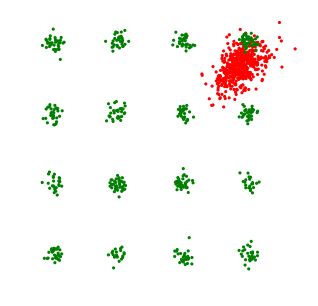

 33%|███▎      | 26696/80001 [05:54<10:00, 88.73it/s]

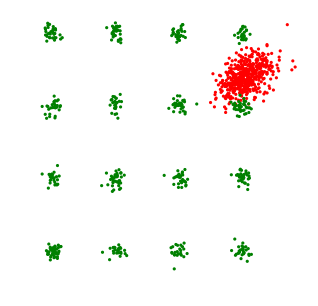

 33%|███▎      | 26799/80001 [05:55<09:57, 89.06it/s]

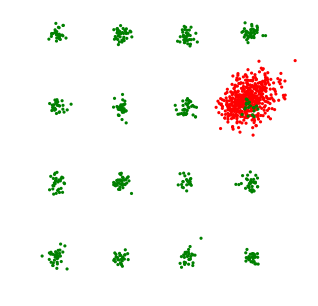

 34%|███▎      | 26893/80001 [05:56<10:02, 88.09it/s]

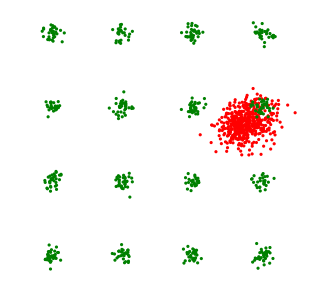

 34%|███▎      | 26997/80001 [05:57<09:56, 88.84it/s]

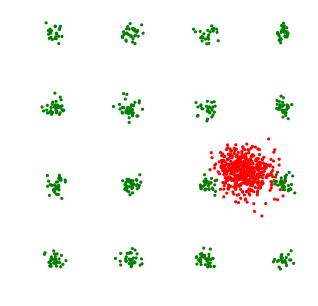

 34%|███▍      | 27092/80001 [05:59<09:56, 88.77it/s]

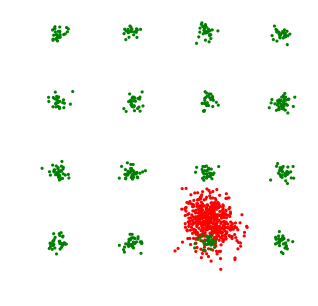

 34%|███▍      | 27194/80001 [06:00<09:53, 88.94it/s]

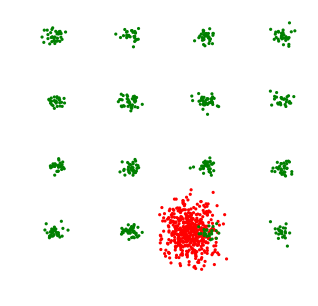

 34%|███▍      | 27299/80001 [06:01<09:51, 89.05it/s]

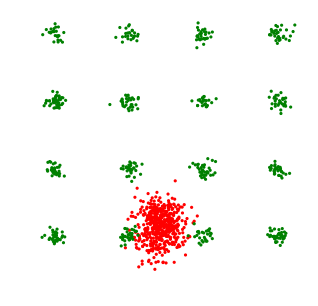

 34%|███▍      | 27392/80001 [06:02<09:55, 88.29it/s]

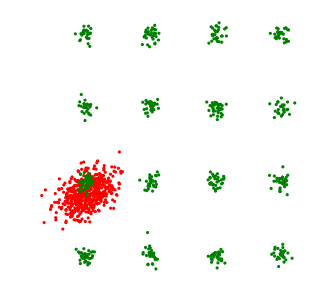

 34%|███▍      | 27495/80001 [06:03<09:40, 90.46it/s]

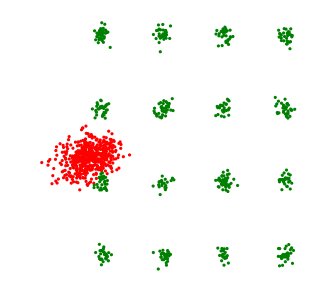

 34%|███▍      | 27594/80001 [06:05<09:45, 89.55it/s]

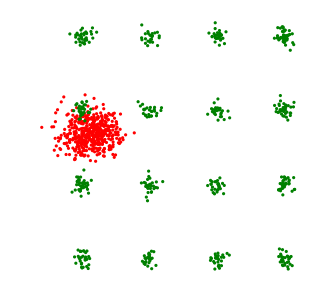

 35%|███▍      | 27700/80001 [06:06<09:49, 88.76it/s]

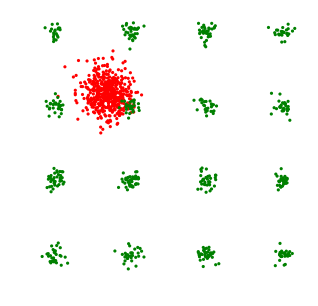

 35%|███▍      | 27798/80001 [06:07<09:40, 89.96it/s]

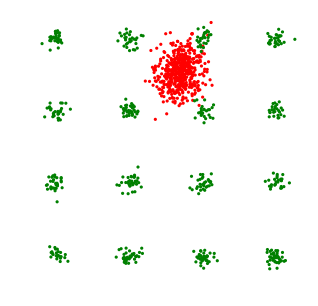

 35%|███▍      | 27896/80001 [06:08<09:29, 91.42it/s]

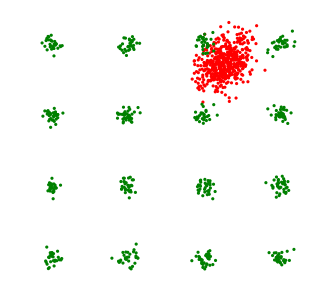

 35%|███▍      | 27996/80001 [06:10<09:33, 90.68it/s]

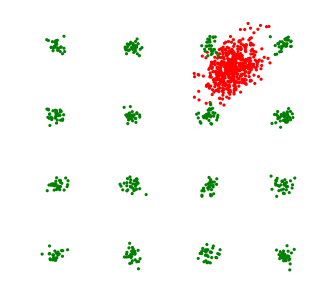

 35%|███▌      | 28095/80001 [06:11<09:38, 89.67it/s]

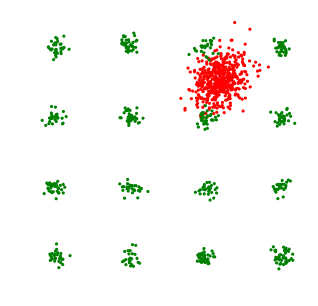

 35%|███▌      | 28200/80001 [06:12<09:40, 89.22it/s]

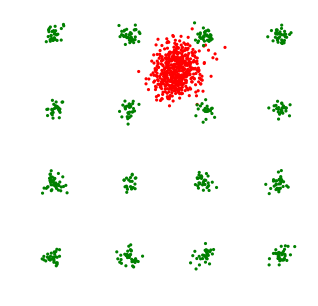

 35%|███▌      | 28299/80001 [06:13<09:17, 92.77it/s]

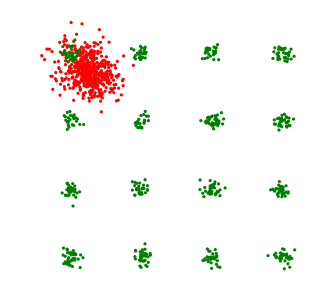

 35%|███▌      | 28398/80001 [06:14<09:29, 90.58it/s]

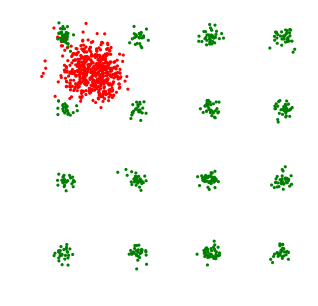

 36%|███▌      | 28495/80001 [06:16<09:44, 88.10it/s]

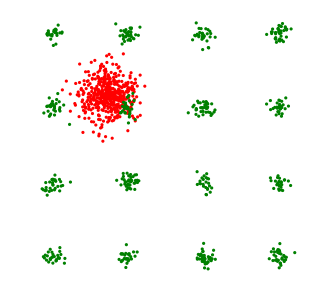

 36%|███▌      | 28594/80001 [06:17<09:31, 89.91it/s]

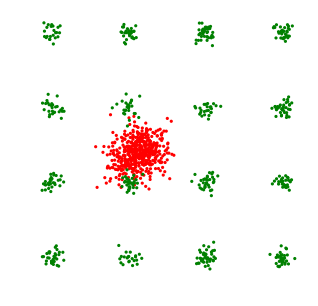

 36%|███▌      | 28693/80001 [06:18<09:23, 91.13it/s]

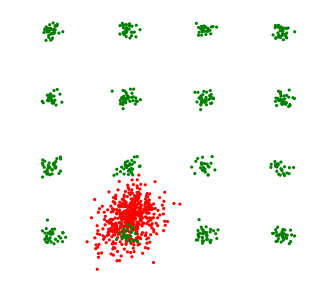

 36%|███▌      | 28793/80001 [06:19<09:26, 90.35it/s]

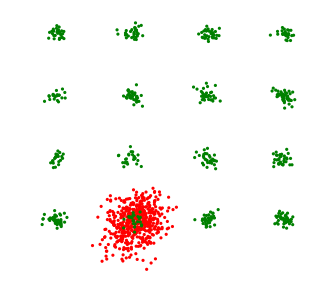

 36%|███▌      | 28891/80001 [06:20<09:25, 90.42it/s]

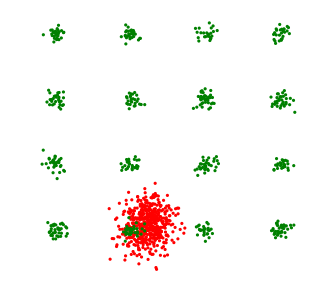

 36%|███▌      | 28999/80001 [06:22<09:29, 89.62it/s]

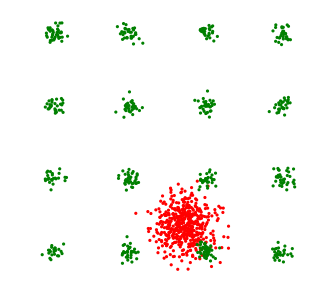

 36%|███▋      | 29098/80001 [06:23<09:22, 90.54it/s]

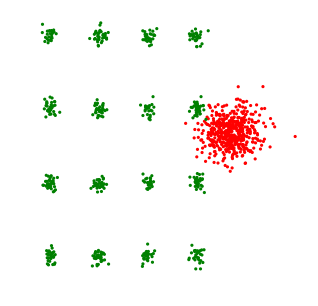

 36%|███▋      | 29195/80001 [06:24<09:26, 89.65it/s]

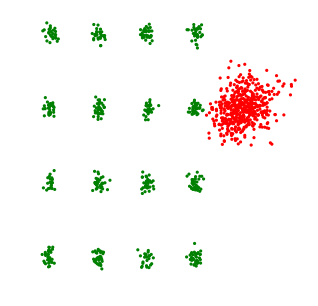

 37%|███▋      | 29291/80001 [06:25<09:29, 89.06it/s]

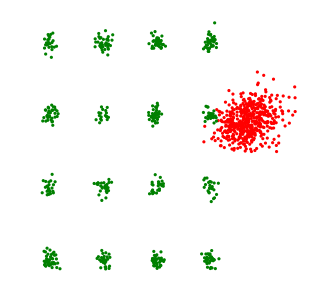

 37%|███▋      | 29397/80001 [06:26<09:27, 89.16it/s]

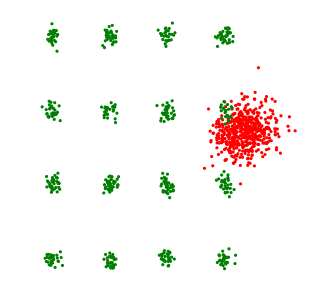

 37%|███▋      | 29500/80001 [06:28<09:37, 87.51it/s]

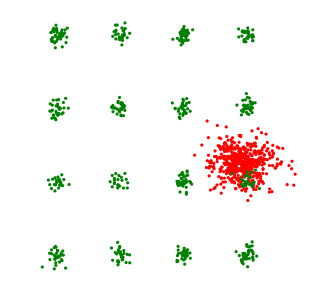

 37%|███▋      | 29593/80001 [06:29<09:36, 87.48it/s]

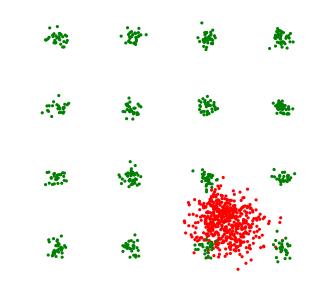

 37%|███▋      | 29694/80001 [06:30<09:18, 90.00it/s]

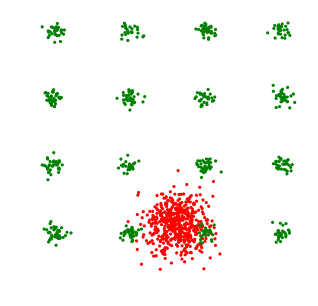

 37%|███▋      | 29798/80001 [06:32<09:28, 88.34it/s]

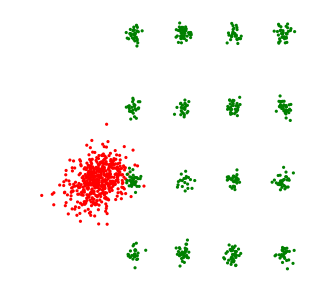

 37%|███▋      | 29893/80001 [06:33<09:25, 88.57it/s]

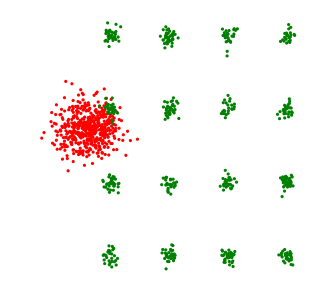

 37%|███▋      | 29998/80001 [06:34<09:20, 89.21it/s]

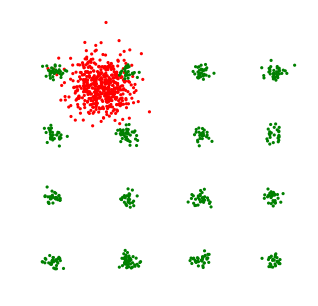

 38%|███▊      | 30100/80001 [06:35<09:23, 88.59it/s]

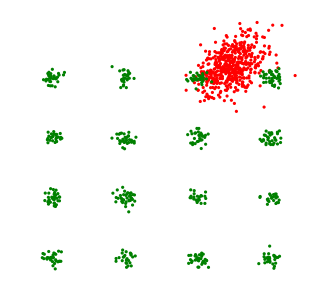

 38%|███▊      | 30192/80001 [06:37<09:29, 87.46it/s]

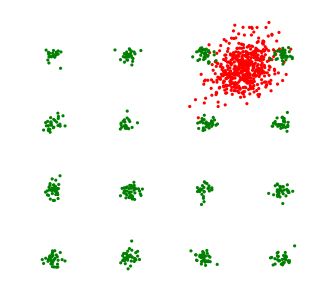

 38%|███▊      | 30297/80001 [06:38<09:15, 89.54it/s]

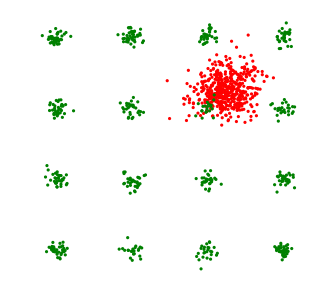

 38%|███▊      | 30392/80001 [06:39<09:20, 88.52it/s]

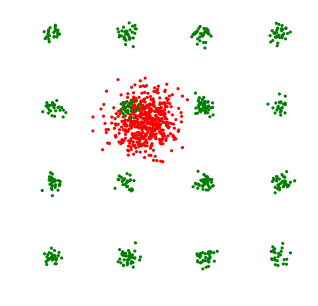

 38%|███▊      | 30497/80001 [06:40<09:14, 89.32it/s]

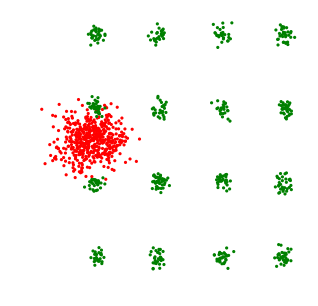

 38%|███▊      | 30597/80001 [06:42<09:17, 88.55it/s]

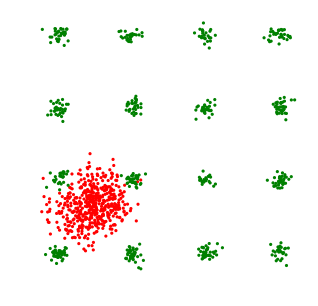

 38%|███▊      | 30693/80001 [06:43<09:02, 90.97it/s]

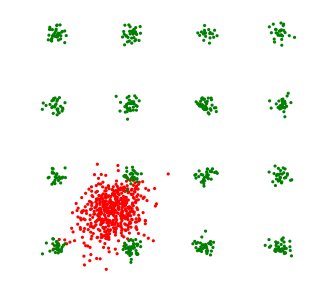

 38%|███▊      | 30800/80001 [06:44<09:10, 89.33it/s]

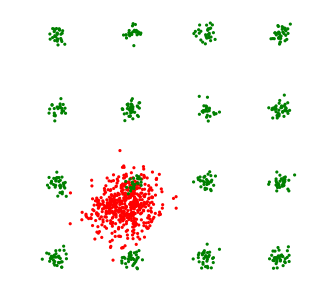

 39%|███▊      | 30896/80001 [06:45<09:15, 88.44it/s]

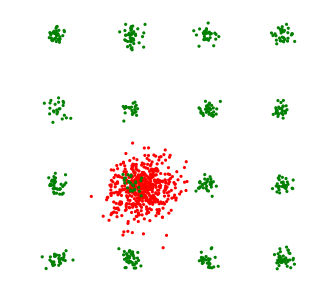

 39%|███▊      | 30996/80001 [06:46<09:21, 87.23it/s]

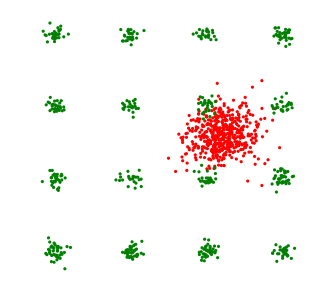

 39%|███▉      | 31097/80001 [06:48<09:13, 88.43it/s]

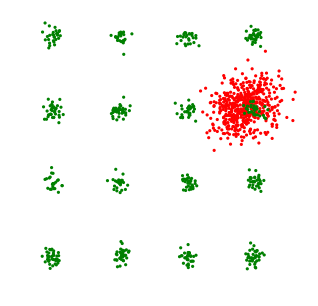

 39%|███▉      | 31193/80001 [06:49<09:14, 88.04it/s]

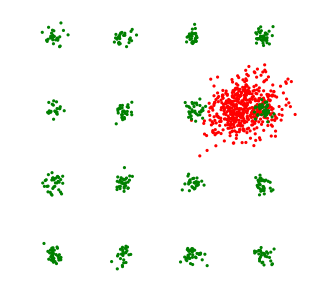

 39%|███▉      | 31296/80001 [06:50<09:14, 87.82it/s]

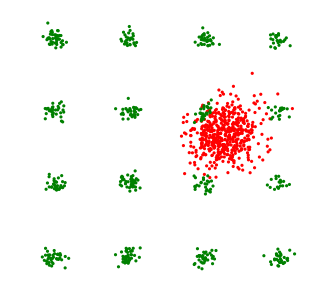

 39%|███▉      | 31397/80001 [06:51<09:10, 88.27it/s]

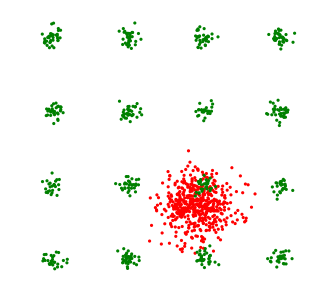

 39%|███▉      | 31492/80001 [06:53<09:05, 88.88it/s]

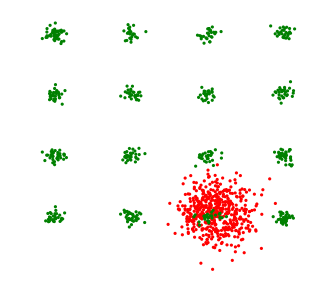

 39%|███▉      | 31596/80001 [06:54<09:07, 88.48it/s]

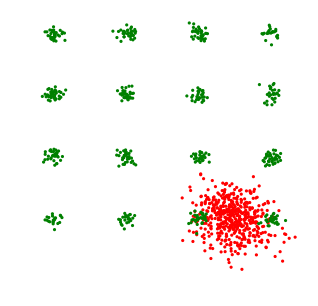

 40%|███▉      | 31699/80001 [06:55<09:02, 89.07it/s]

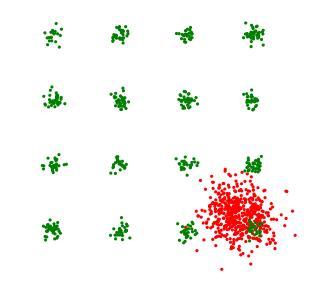

 40%|███▉      | 31793/80001 [06:56<09:02, 88.86it/s]

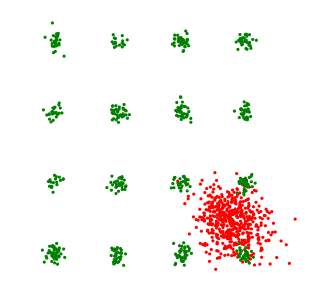

 40%|███▉      | 31897/80001 [06:58<08:59, 89.20it/s]

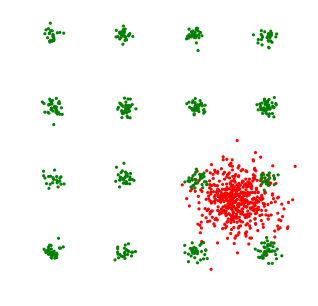

 40%|███▉      | 31999/80001 [06:59<09:02, 88.50it/s]

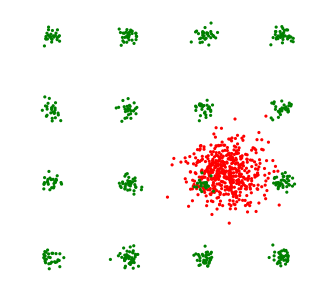

 40%|████      | 32091/80001 [07:00<09:06, 87.68it/s]

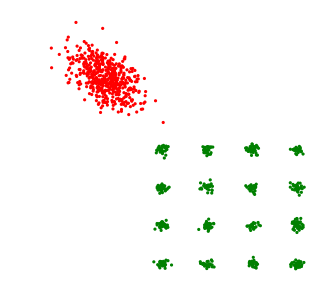

 40%|████      | 32195/80001 [07:01<09:01, 88.31it/s]

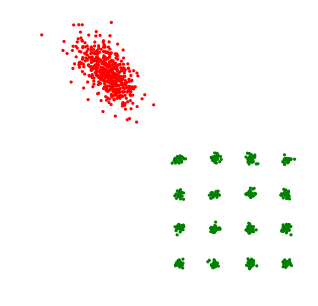

 40%|████      | 32299/80001 [07:03<08:57, 88.72it/s]

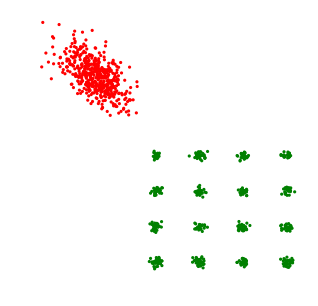

 40%|████      | 32395/80001 [07:04<09:07, 86.93it/s]

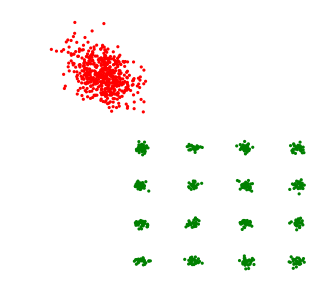

 41%|████      | 32498/80001 [07:05<08:57, 88.31it/s]

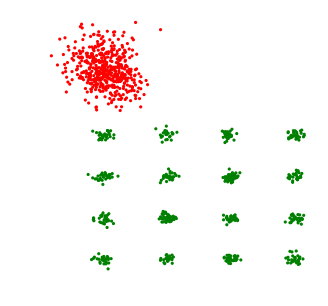

 41%|████      | 32599/80001 [07:06<09:00, 87.69it/s]

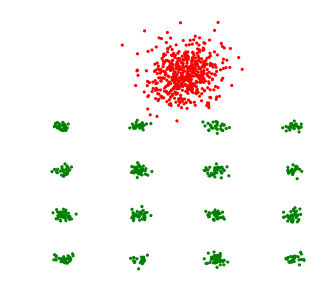

 41%|████      | 32692/80001 [07:07<08:55, 88.31it/s]

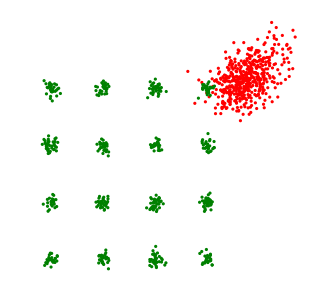

 41%|████      | 32797/80001 [07:09<08:51, 88.73it/s]

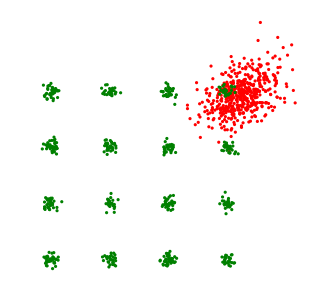

 41%|████      | 32898/80001 [07:10<08:57, 87.58it/s]

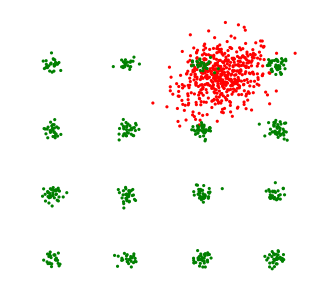

 41%|████      | 32993/80001 [07:11<08:52, 88.28it/s]

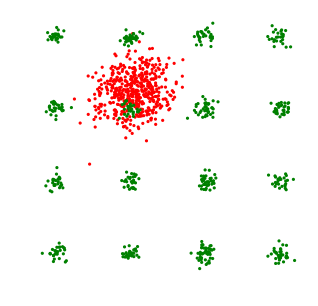

 41%|████▏     | 33096/80001 [07:12<08:38, 90.48it/s]

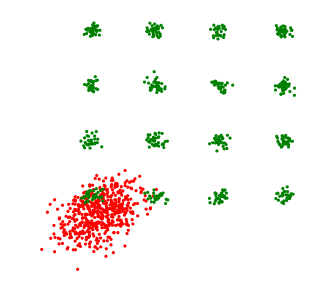

 41%|████▏     | 33199/80001 [07:14<08:47, 88.72it/s]

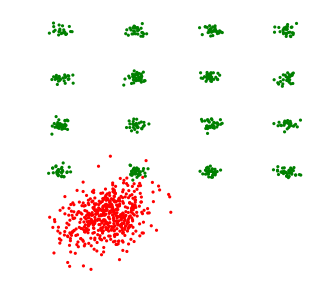

 42%|████▏     | 33293/80001 [07:15<08:48, 88.33it/s]

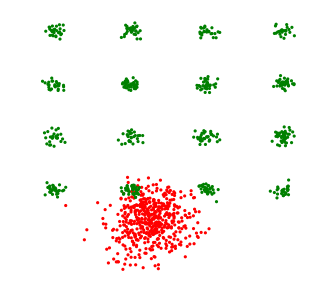

 42%|████▏     | 33397/80001 [07:16<08:40, 89.53it/s]

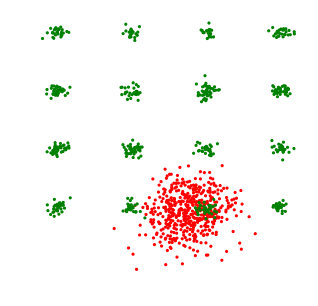

 42%|████▏     | 33494/80001 [07:18<08:51, 87.56it/s]

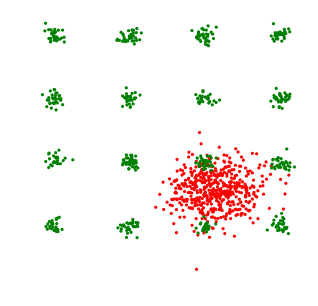

 42%|████▏     | 33598/80001 [07:19<08:41, 88.90it/s]

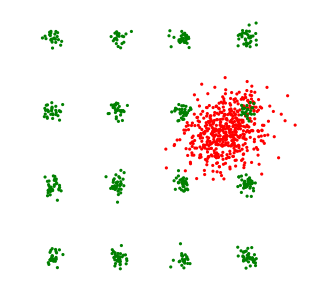

 42%|████▏     | 33693/80001 [07:20<08:47, 87.80it/s]

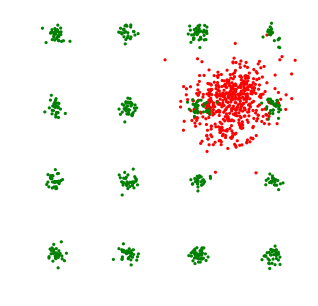

 42%|████▏     | 33795/80001 [07:21<08:47, 87.64it/s]

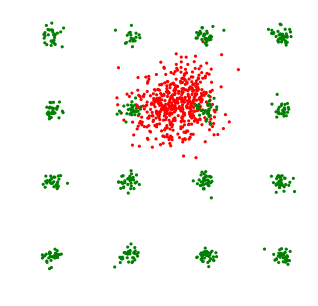

 42%|████▏     | 33899/80001 [07:23<08:35, 89.46it/s]

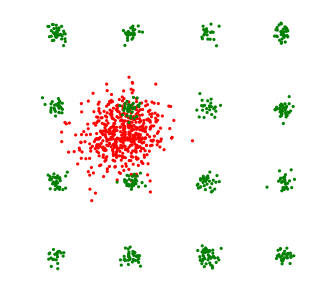

 42%|████▏     | 33992/80001 [07:24<08:48, 87.10it/s]

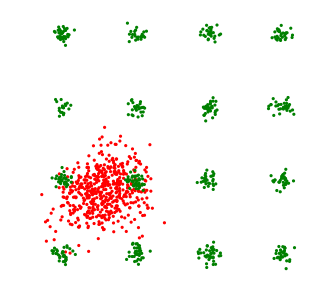

 43%|████▎     | 34094/80001 [07:25<08:41, 87.97it/s]

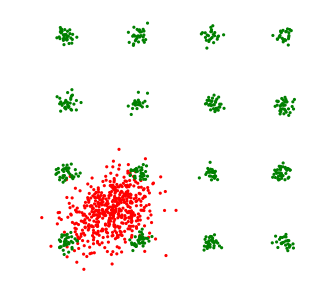

 43%|████▎     | 34196/80001 [07:26<08:38, 88.33it/s]

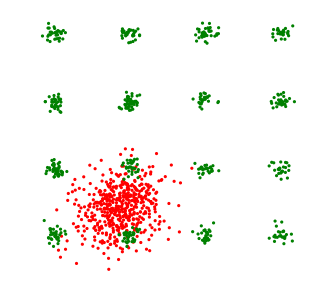

 43%|████▎     | 34298/80001 [07:28<08:35, 88.70it/s]

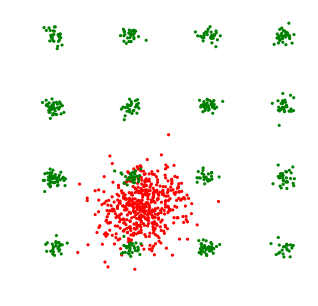

 43%|████▎     | 34394/80001 [07:29<08:33, 88.87it/s]

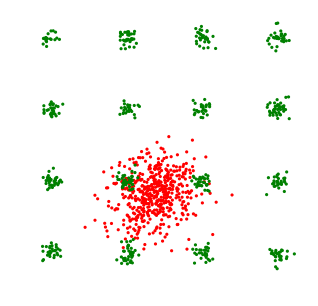

 43%|████▎     | 34498/80001 [07:30<08:34, 88.47it/s]

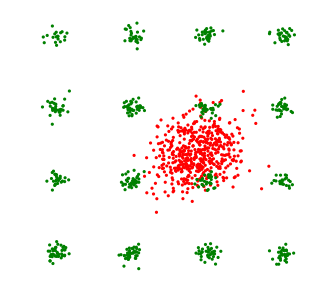

 43%|████▎     | 34597/80001 [07:31<08:48, 85.84it/s]

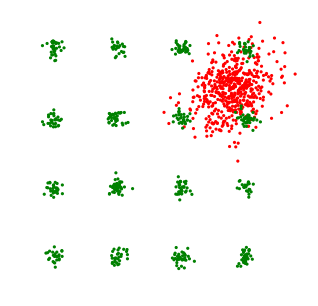

 43%|████▎     | 34694/80001 [07:32<08:31, 88.58it/s]

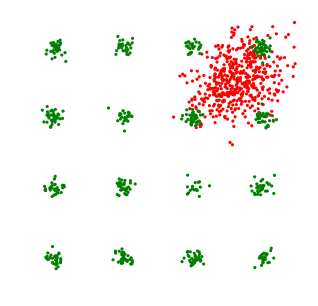

 43%|████▎     | 34798/80001 [07:34<08:29, 88.79it/s]

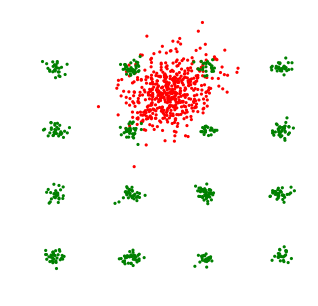

 44%|████▎     | 34893/80001 [07:35<08:30, 88.28it/s]

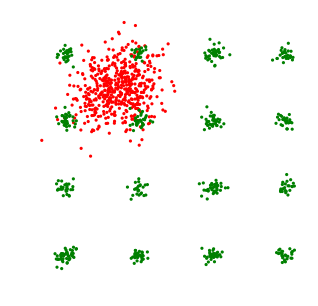

 44%|████▎     | 34992/80001 [07:36<08:34, 87.50it/s]

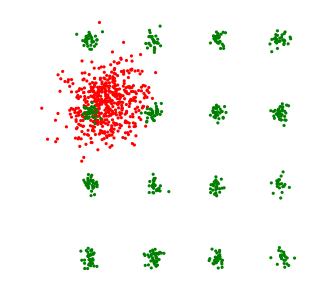

 44%|████▍     | 35095/80001 [07:37<08:25, 88.90it/s]

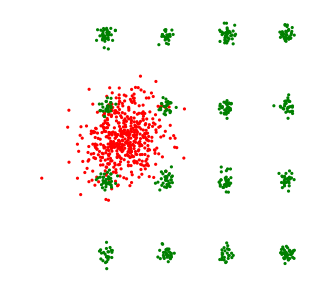

 44%|████▍     | 35196/80001 [07:39<08:28, 88.13it/s]

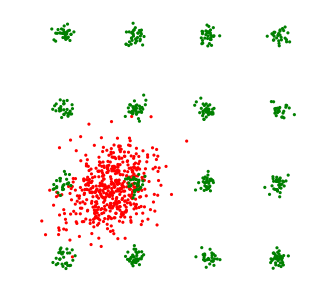

 44%|████▍     | 35299/80001 [07:40<08:24, 88.56it/s]

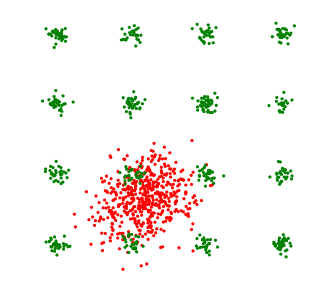

 44%|████▍     | 35392/80001 [07:41<08:23, 88.62it/s]

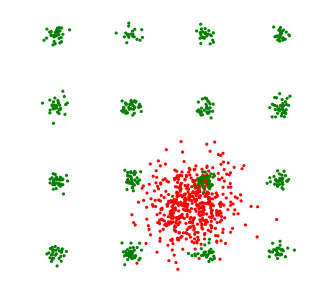

 44%|████▍     | 35499/80001 [07:42<08:18, 89.26it/s]

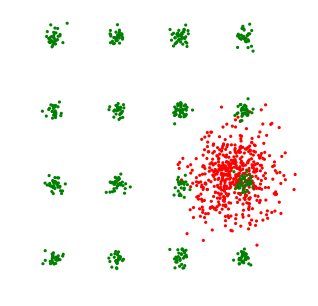

 44%|████▍     | 35592/80001 [07:44<08:23, 88.18it/s]

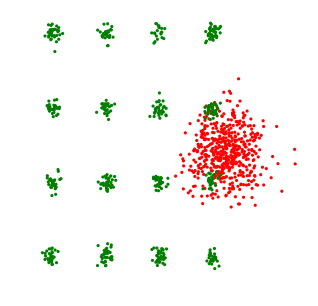

 45%|████▍     | 35698/80001 [07:45<08:15, 89.46it/s]

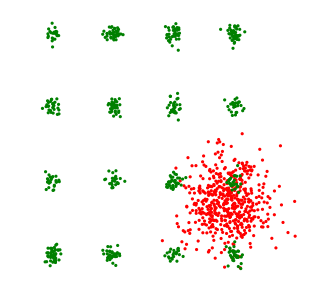

 45%|████▍     | 35791/80001 [07:46<08:25, 87.40it/s]

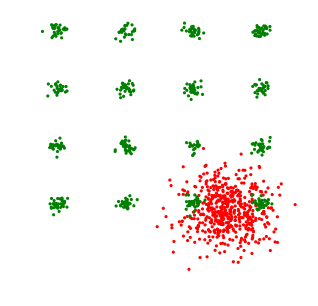

 45%|████▍     | 35896/80001 [07:47<08:10, 89.95it/s]

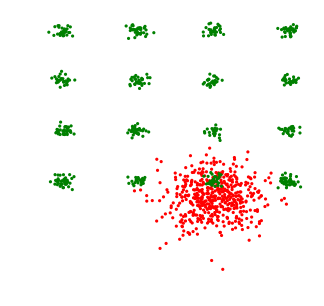

 45%|████▍     | 35992/80001 [07:48<08:12, 89.33it/s]

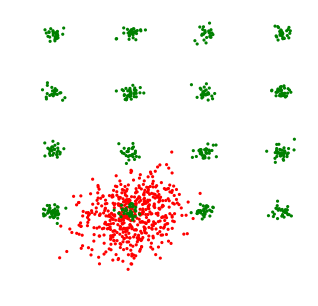

 45%|████▌     | 36094/80001 [07:50<08:27, 86.48it/s]

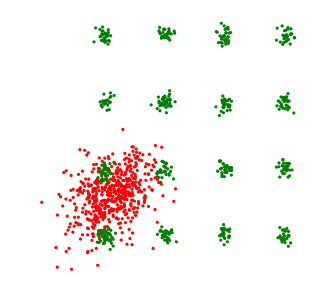

 45%|████▌     | 36196/80001 [07:51<08:12, 88.91it/s]

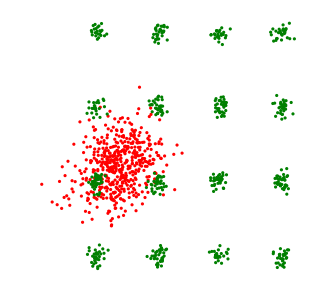

 45%|████▌     | 36299/80001 [07:52<08:17, 87.80it/s]

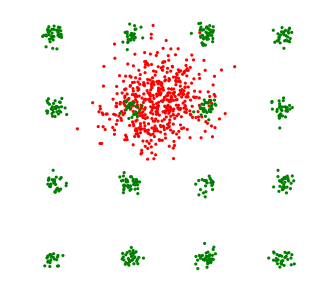

 45%|████▌     | 36400/80001 [07:54<08:15, 88.08it/s]

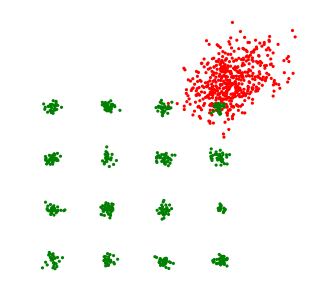

 46%|████▌     | 36493/80001 [07:55<08:17, 87.42it/s]

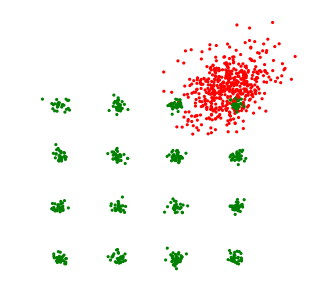

 46%|████▌     | 36594/80001 [07:56<08:12, 88.17it/s]

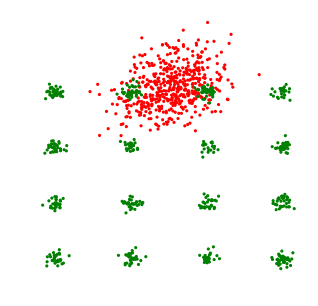

 46%|████▌     | 36698/80001 [07:57<08:04, 89.44it/s]

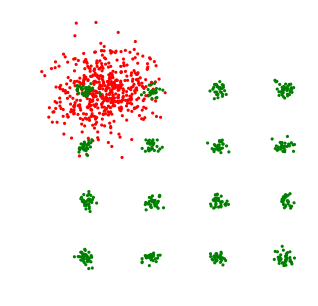

 46%|████▌     | 36791/80001 [07:59<08:14, 87.39it/s]

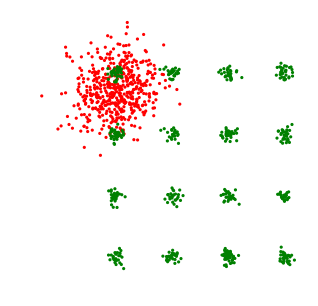

 46%|████▌     | 36893/80001 [08:00<08:15, 87.09it/s]

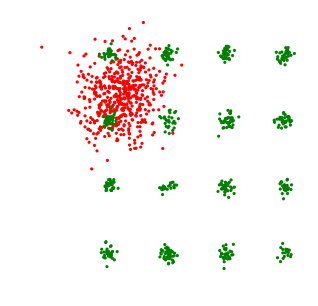

 46%|████▌     | 36995/80001 [08:01<08:05, 88.60it/s]

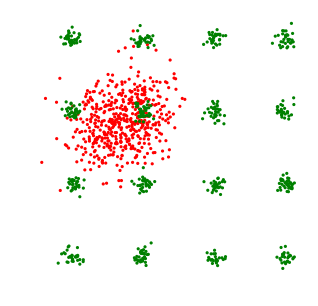

 46%|████▋     | 37093/80001 [08:02<07:41, 93.00it/s]

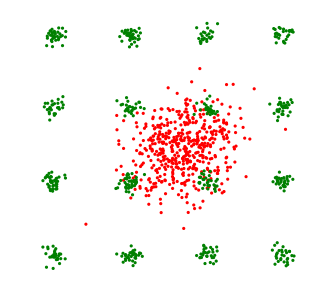

 46%|████▋     | 37198/80001 [08:04<08:01, 88.95it/s]

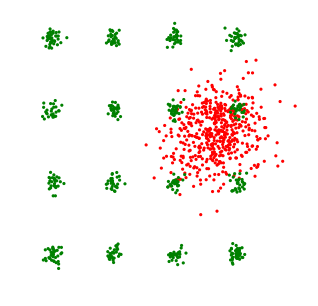

 47%|████▋     | 37300/80001 [08:05<08:01, 88.61it/s]

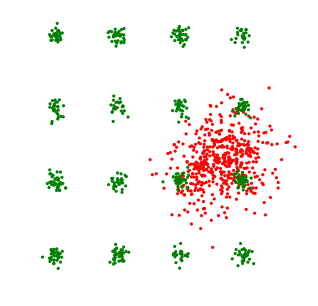

 47%|████▋     | 37394/80001 [08:06<08:02, 88.26it/s]

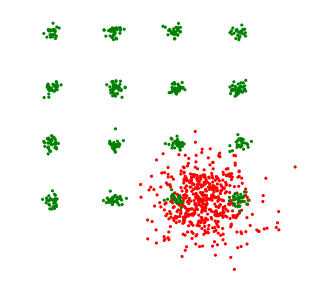

 47%|████▋     | 37499/80001 [08:07<08:08, 87.00it/s]

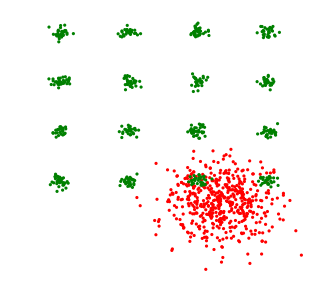

 47%|████▋     | 37594/80001 [08:09<07:55, 89.13it/s]

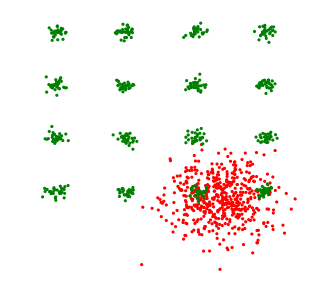

 47%|████▋     | 37693/80001 [08:10<08:06, 87.04it/s]

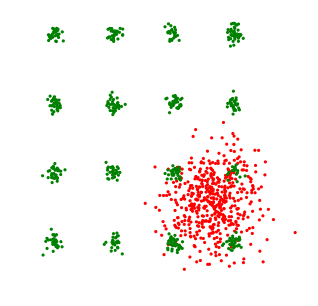

 47%|████▋     | 37796/80001 [08:11<07:56, 88.57it/s]

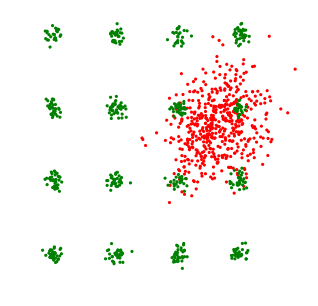

 47%|████▋     | 37894/80001 [08:12<07:53, 88.87it/s]

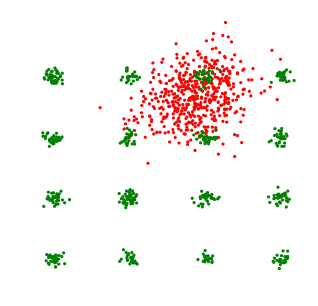

 47%|████▋     | 37992/80001 [08:14<07:52, 88.90it/s]

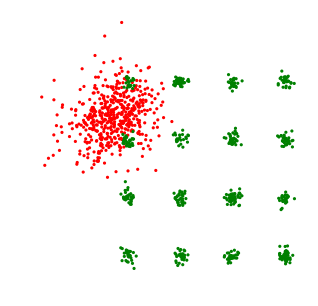

 48%|████▊     | 38094/80001 [08:15<07:58, 87.52it/s]

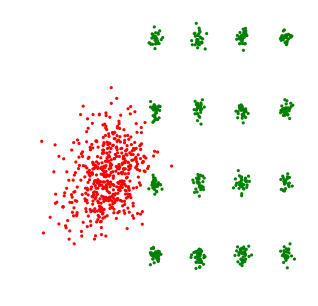

 48%|████▊     | 38197/80001 [08:16<07:54, 88.10it/s]

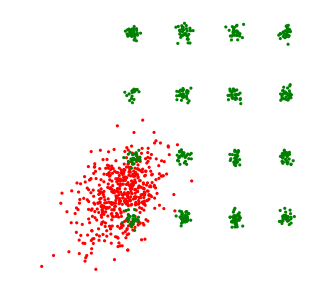

 48%|████▊     | 38291/80001 [08:17<07:47, 89.16it/s]

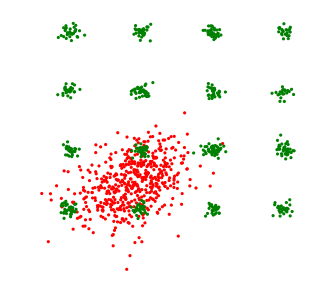

 48%|████▊     | 38396/80001 [08:19<07:51, 88.22it/s]

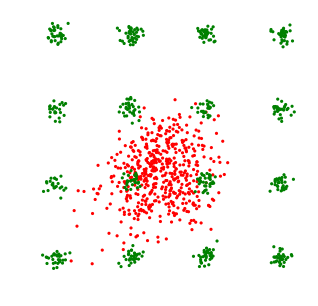

 48%|████▊     | 38498/80001 [08:20<07:52, 87.84it/s]

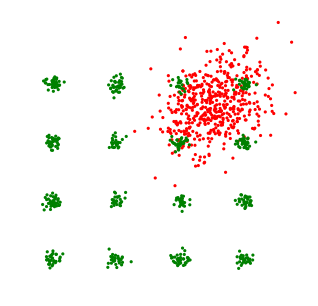

 48%|████▊     | 38592/80001 [08:21<07:45, 88.91it/s]

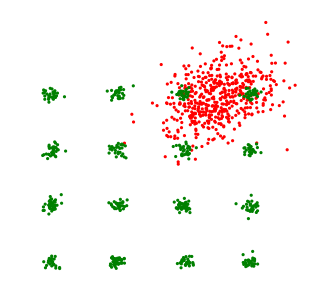

 48%|████▊     | 38700/80001 [08:22<07:43, 89.10it/s]

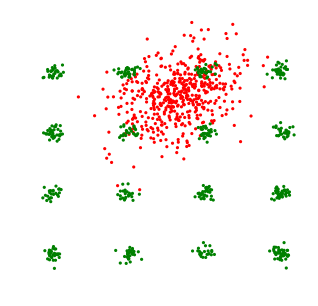

 48%|████▊     | 38796/80001 [08:24<07:43, 88.85it/s]

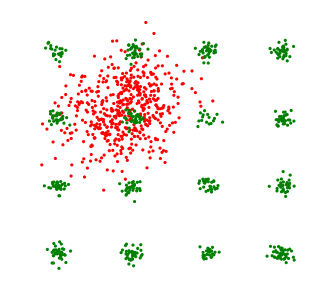

 49%|████▊     | 38891/80001 [08:25<07:44, 88.60it/s]

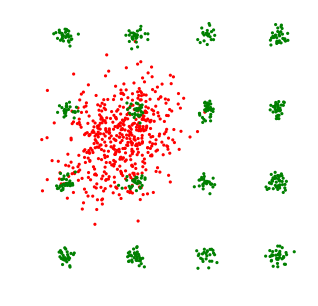

 49%|████▊     | 38996/80001 [08:26<07:40, 89.09it/s]

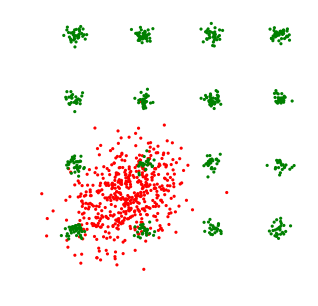

 49%|████▉     | 39091/80001 [08:27<07:42, 88.37it/s]

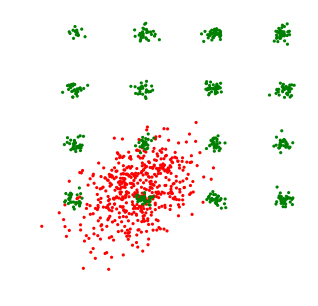

 49%|████▉     | 39196/80001 [08:29<07:39, 88.77it/s]

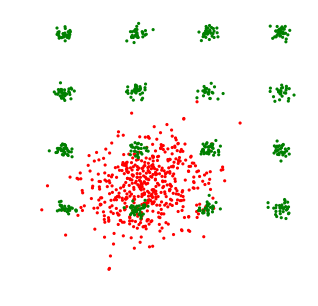

 49%|████▉     | 39298/80001 [08:30<07:39, 88.52it/s]

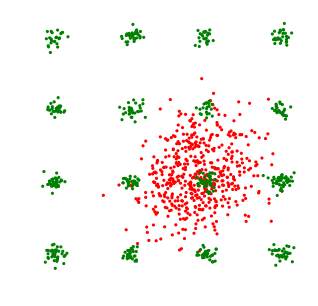

 49%|████▉     | 39400/80001 [08:31<07:36, 89.02it/s]

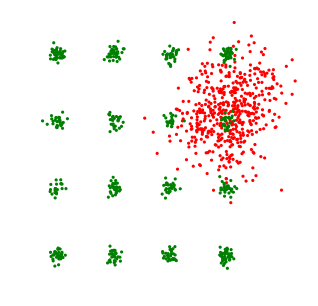

 49%|████▉     | 39495/80001 [08:32<07:32, 89.50it/s]

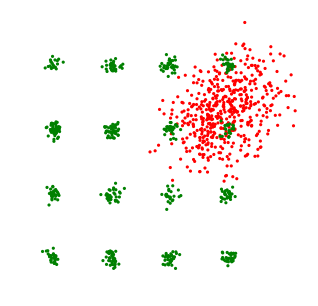

 49%|████▉     | 39592/80001 [08:34<07:35, 88.81it/s]

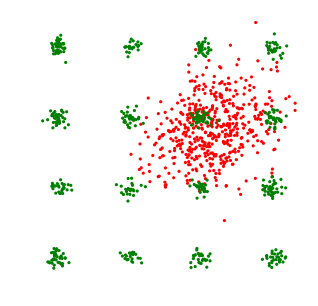

 50%|████▉     | 39692/80001 [08:35<07:44, 86.80it/s]

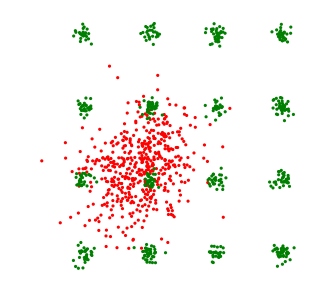

 50%|████▉     | 39796/80001 [08:36<07:30, 89.31it/s]

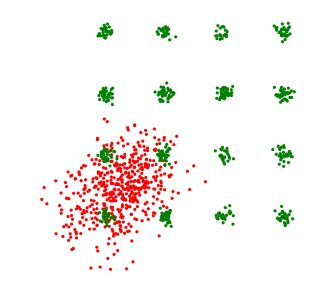

 50%|████▉     | 39900/80001 [08:37<07:34, 88.15it/s]

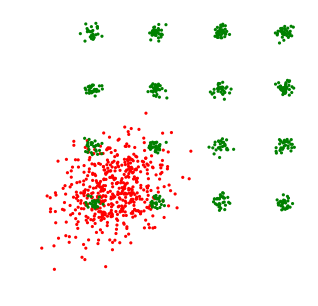

 50%|████▉     | 39998/80001 [08:39<07:24, 89.97it/s]

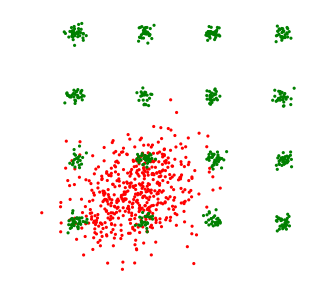

 50%|█████     | 40099/80001 [08:40<07:35, 87.64it/s]

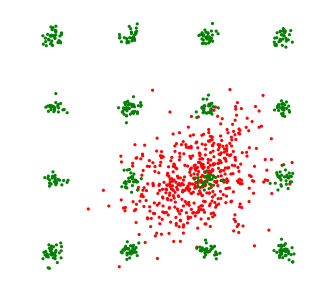

 50%|█████     | 40195/80001 [08:41<07:24, 89.54it/s]

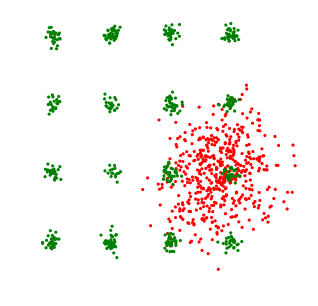

 50%|█████     | 40299/80001 [08:42<07:33, 87.55it/s]

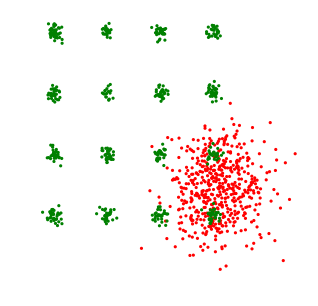

 50%|█████     | 40395/80001 [08:44<07:29, 88.19it/s]

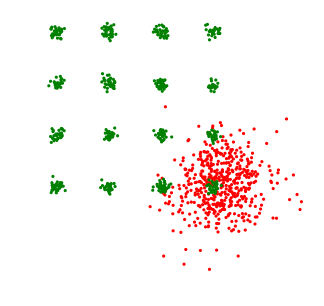

 51%|█████     | 40499/80001 [08:45<07:29, 87.85it/s]

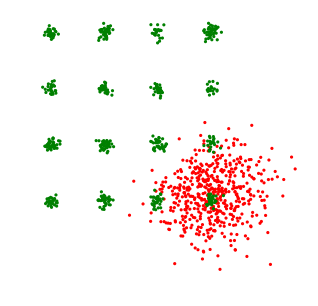

 51%|█████     | 40596/80001 [08:46<07:21, 89.21it/s]

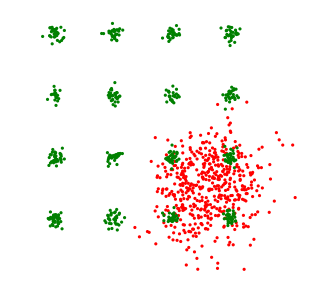

 51%|█████     | 40699/80001 [08:47<07:26, 88.10it/s]

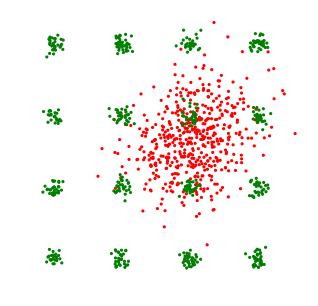

 51%|█████     | 40796/80001 [08:48<07:18, 89.49it/s]

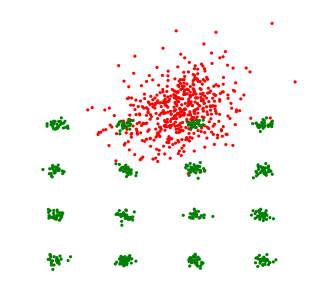

 51%|█████     | 40897/80001 [08:50<07:23, 88.09it/s]

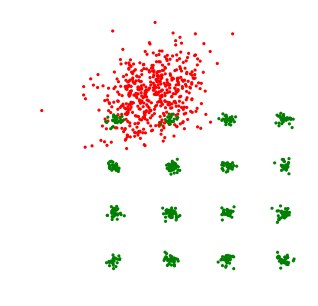

 51%|█████     | 40992/80001 [08:51<07:18, 88.92it/s]

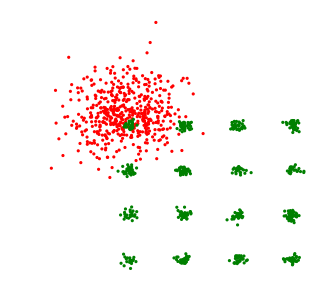

 51%|█████▏    | 41097/80001 [08:52<07:11, 90.19it/s]

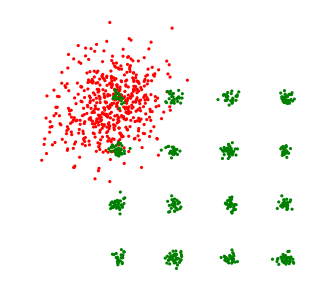

 51%|█████▏    | 41192/80001 [08:53<07:16, 88.83it/s]

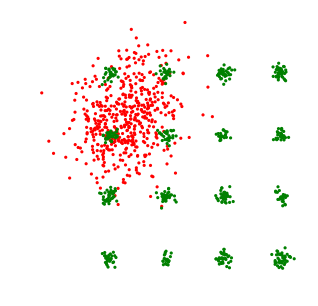

 52%|█████▏    | 41293/80001 [08:55<07:18, 88.24it/s]

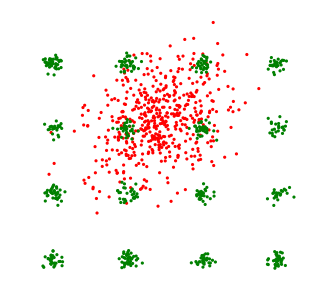

 52%|█████▏    | 41397/80001 [08:56<07:13, 89.06it/s]

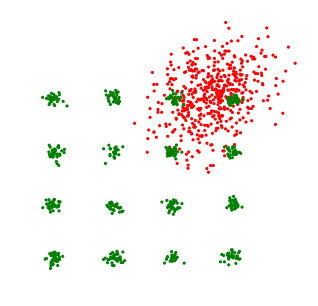

 52%|█████▏    | 41499/80001 [08:57<07:22, 86.99it/s]

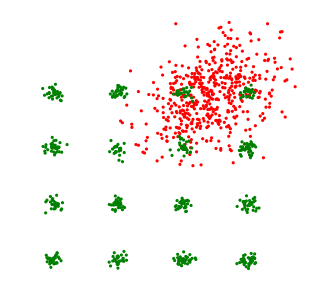

 52%|█████▏    | 41600/80001 [08:59<07:19, 87.44it/s]

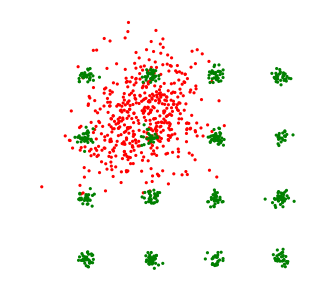

 52%|█████▏    | 41692/80001 [09:00<07:16, 87.71it/s]

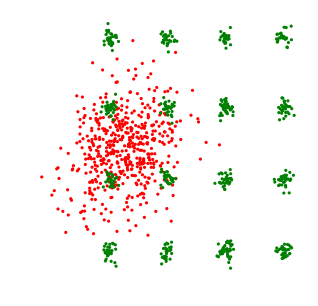

 52%|█████▏    | 41798/80001 [09:01<07:01, 90.54it/s]

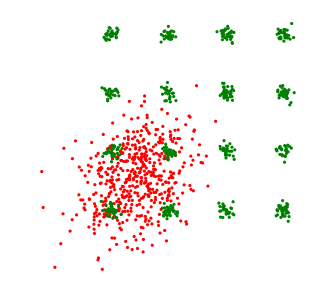

 52%|█████▏    | 41900/80001 [09:02<07:09, 88.79it/s]

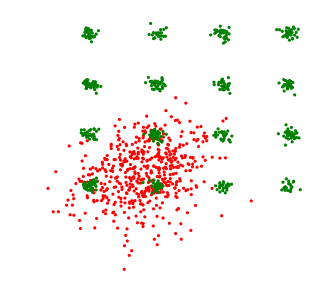

 52%|█████▏    | 41997/80001 [09:04<07:07, 88.84it/s]

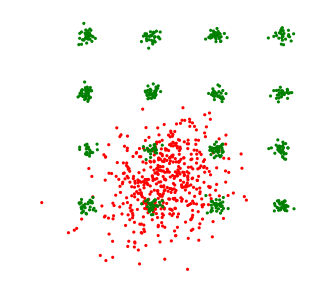

 53%|█████▎    | 42094/80001 [09:05<07:11, 87.83it/s]

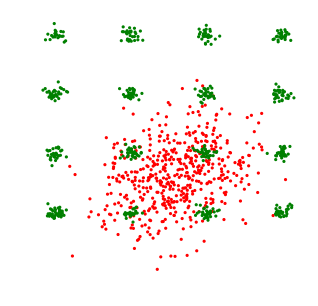

 53%|█████▎    | 42195/80001 [09:06<07:06, 88.71it/s]

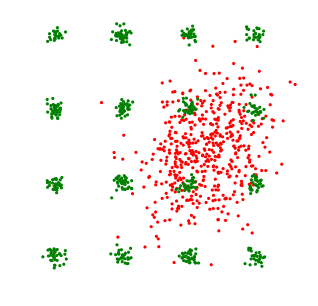

 53%|█████▎    | 42291/80001 [09:07<07:05, 88.55it/s]

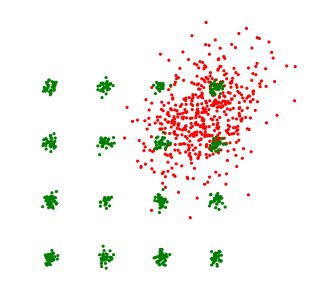

 53%|█████▎    | 42396/80001 [09:08<06:59, 89.72it/s]

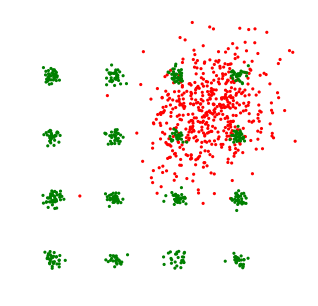

 53%|█████▎    | 42497/80001 [09:10<07:07, 87.74it/s]

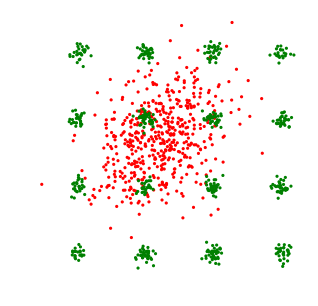

 53%|█████▎    | 42592/80001 [09:11<07:02, 88.46it/s]

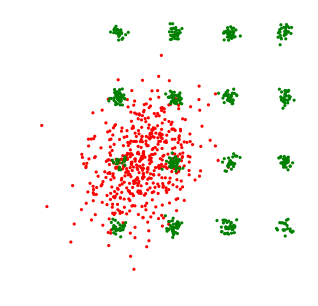

 53%|█████▎    | 42694/80001 [09:12<07:00, 88.69it/s]

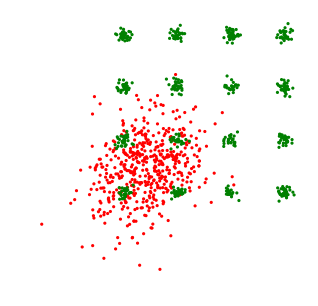

 53%|█████▎    | 42795/80001 [09:13<07:08, 86.84it/s]

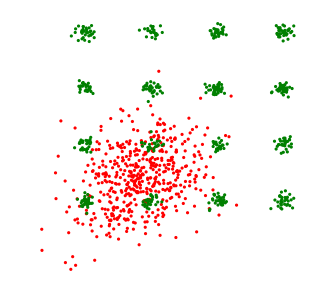

 54%|█████▎    | 42895/80001 [09:15<07:13, 85.61it/s]

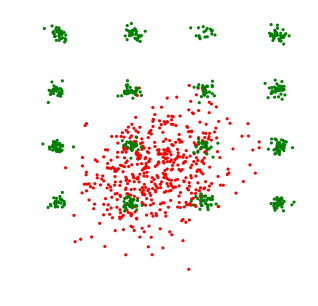

 54%|█████▎    | 42993/80001 [09:16<06:53, 89.57it/s]

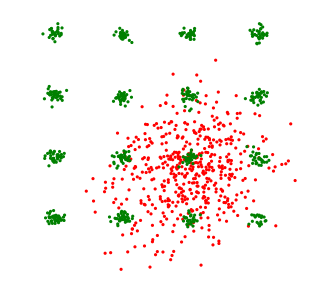

 54%|█████▍    | 43098/80001 [09:17<06:52, 89.36it/s]

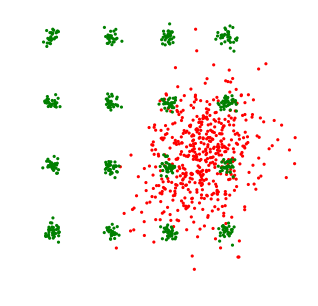

 54%|█████▍    | 43194/80001 [09:18<06:54, 88.89it/s]

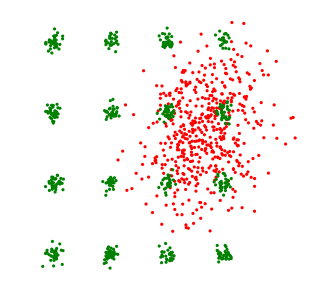

 54%|█████▍    | 43297/80001 [09:20<06:53, 88.76it/s]

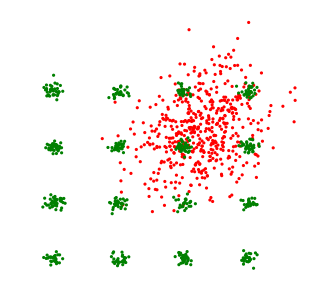

 54%|█████▍    | 43393/80001 [09:21<06:53, 88.59it/s]

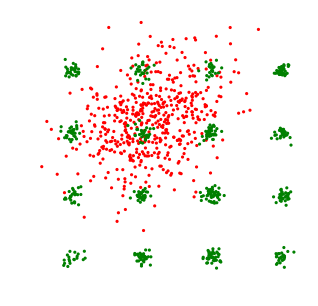

 54%|█████▍    | 43496/80001 [09:22<06:51, 88.68it/s]

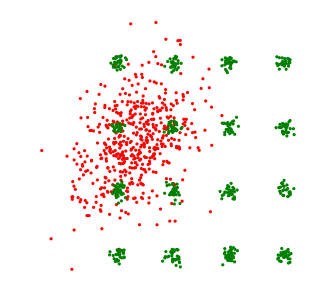

 54%|█████▍    | 43598/80001 [09:23<06:49, 89.00it/s]

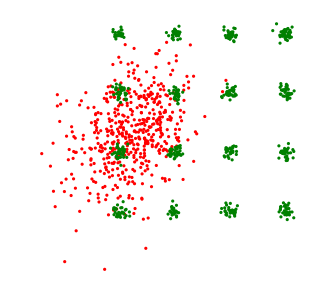

 55%|█████▍    | 43691/80001 [09:24<06:52, 88.11it/s]

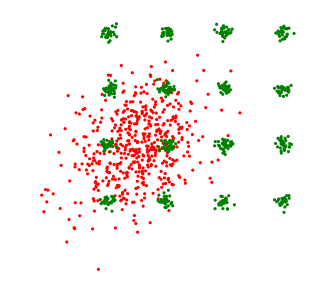

 55%|█████▍    | 43794/80001 [09:26<06:46, 89.01it/s]

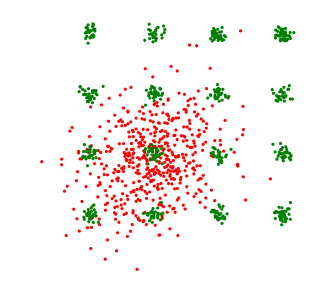

 55%|█████▍    | 43891/80001 [09:27<06:43, 89.46it/s]

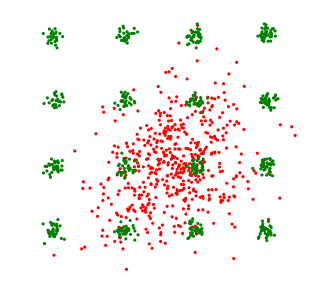

 55%|█████▍    | 43997/80001 [09:28<06:43, 89.24it/s]

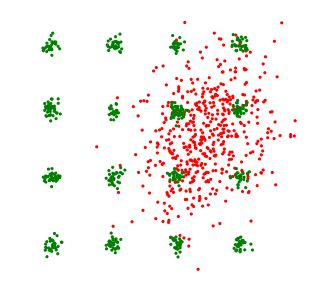

 55%|█████▌    | 44097/80001 [09:29<06:48, 87.94it/s]

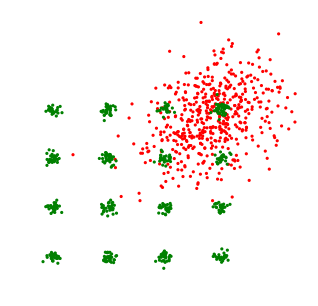

 55%|█████▌    | 44196/80001 [09:31<06:29, 91.95it/s]

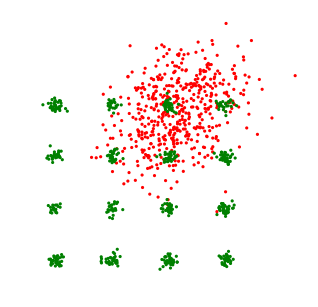

 55%|█████▌    | 44300/80001 [09:32<06:39, 89.26it/s]

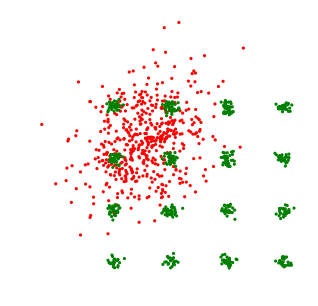

 55%|█████▌    | 44394/80001 [09:33<06:48, 87.10it/s]

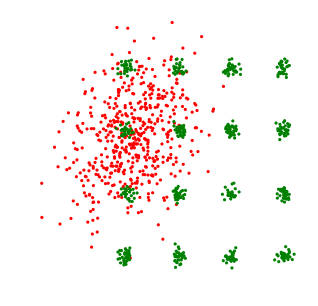

 56%|█████▌    | 44495/80001 [09:34<06:41, 88.34it/s]

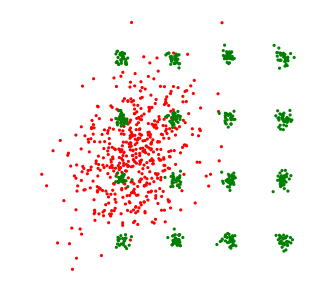

 56%|█████▌    | 44596/80001 [09:36<06:43, 87.84it/s]

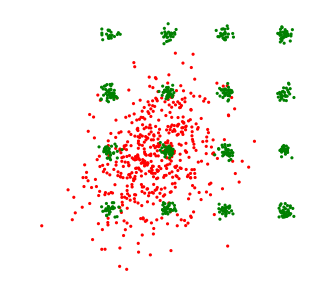

 56%|█████▌    | 44691/80001 [09:37<06:53, 85.41it/s]

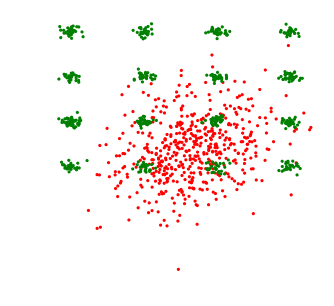

 56%|█████▌    | 44796/80001 [09:38<06:36, 88.81it/s]

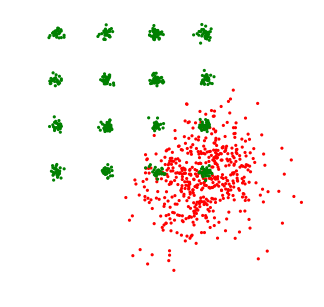

 56%|█████▌    | 44898/80001 [09:39<06:39, 87.91it/s]

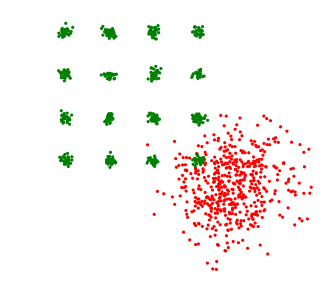

 56%|█████▌    | 44993/80001 [09:41<06:34, 88.80it/s]

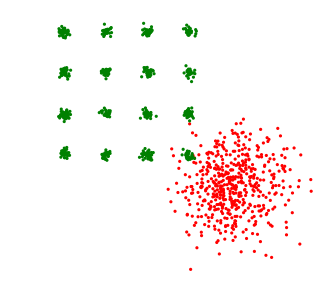

 56%|█████▋    | 45097/80001 [09:42<06:32, 88.91it/s]

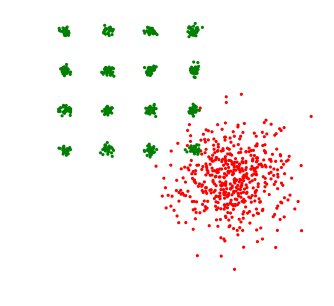

 56%|█████▋    | 45199/80001 [09:43<06:32, 88.69it/s]

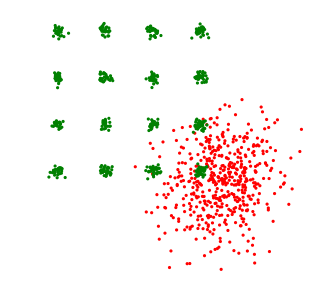

 57%|█████▋    | 45292/80001 [09:44<06:32, 88.40it/s]

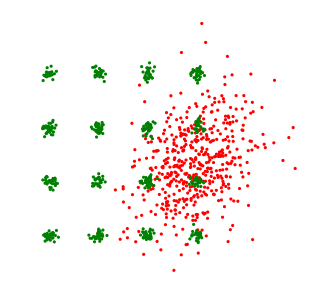

 57%|█████▋    | 45395/80001 [09:46<06:36, 87.25it/s]

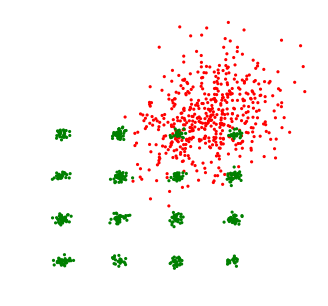

 57%|█████▋    | 45498/80001 [09:47<06:28, 88.74it/s]

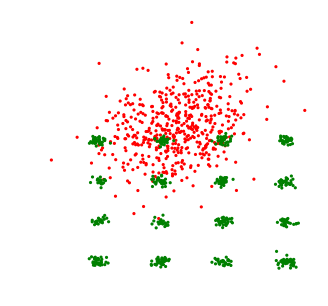

 57%|█████▋    | 45592/80001 [09:48<06:27, 88.90it/s]

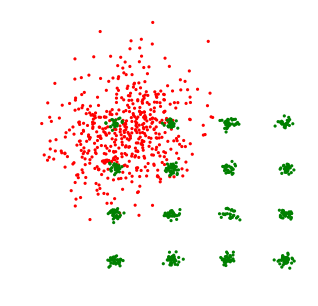

 57%|█████▋    | 45693/80001 [09:50<06:31, 87.68it/s]

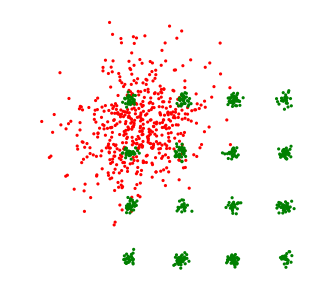

 57%|█████▋    | 45799/80001 [09:51<06:24, 88.87it/s]

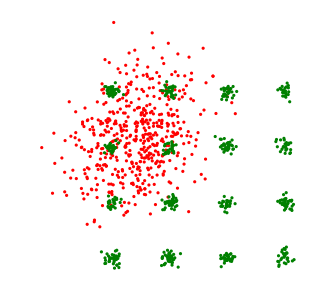

 57%|█████▋    | 45892/80001 [09:52<06:27, 87.96it/s]

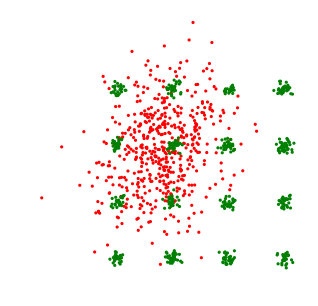

 57%|█████▋    | 45994/80001 [09:53<06:24, 88.51it/s]

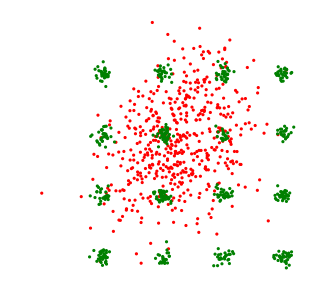

 58%|█████▊    | 46096/80001 [09:55<06:22, 88.74it/s]

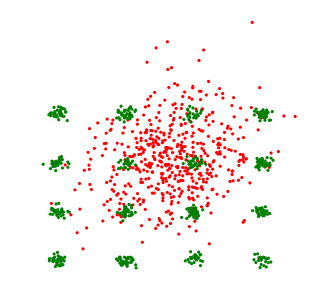

 58%|█████▊    | 46199/80001 [09:56<06:34, 85.79it/s]

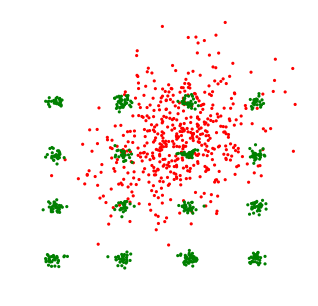

 58%|█████▊    | 46299/80001 [09:57<06:22, 88.20it/s]

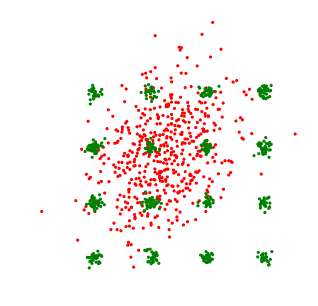

 58%|█████▊    | 46399/80001 [09:58<06:23, 87.73it/s]

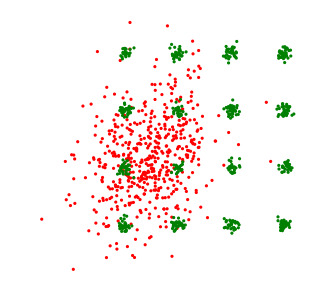

 58%|█████▊    | 46491/80001 [10:00<06:18, 88.48it/s]

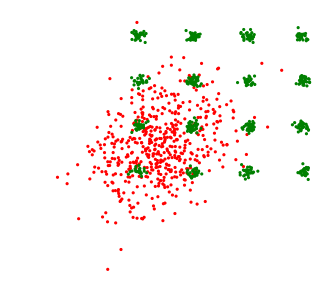

 58%|█████▊    | 46599/80001 [10:01<06:15, 88.88it/s]

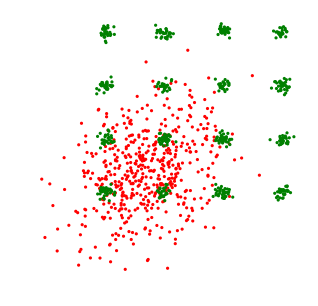

 58%|█████▊    | 46694/80001 [10:02<06:16, 88.38it/s]

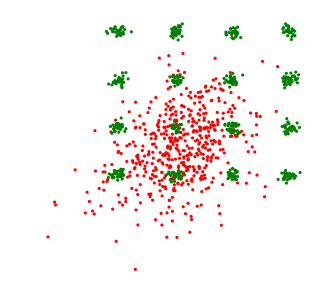

 58%|█████▊    | 46799/80001 [10:03<06:38, 83.27it/s]

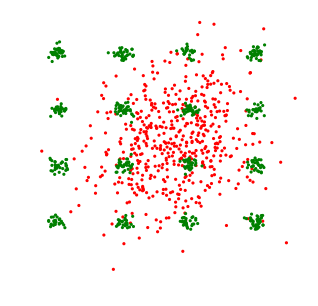

 59%|█████▊    | 46895/80001 [10:05<06:13, 88.53it/s]

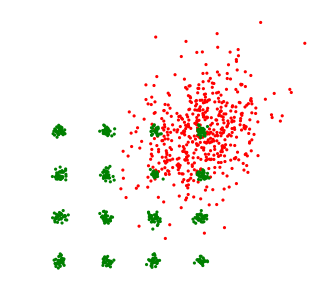

 59%|█████▊    | 46998/80001 [10:06<06:13, 88.35it/s]

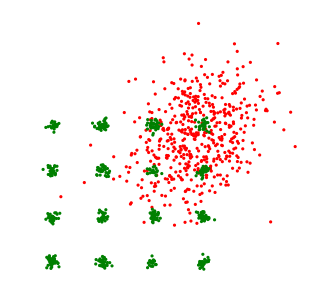

 59%|█████▉    | 47095/80001 [10:07<06:09, 88.99it/s]

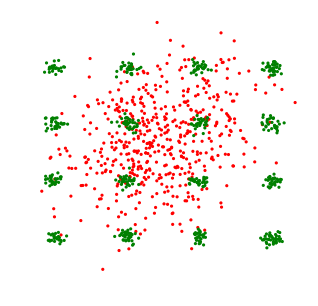

 59%|█████▉    | 47197/80001 [10:08<06:10, 88.64it/s]

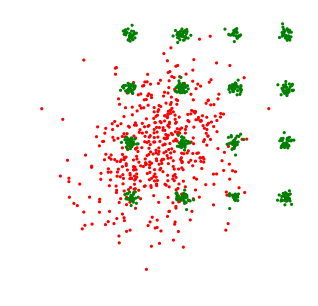

 59%|█████▉    | 47299/80001 [10:10<06:07, 89.02it/s]

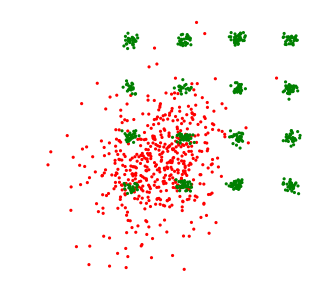

 59%|█████▉    | 47394/80001 [10:11<06:07, 88.67it/s]

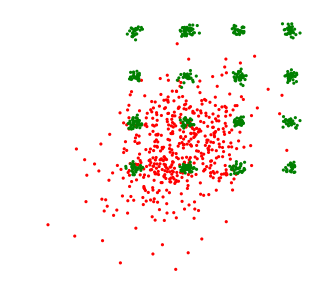

 59%|█████▉    | 47497/80001 [10:12<06:06, 88.79it/s]

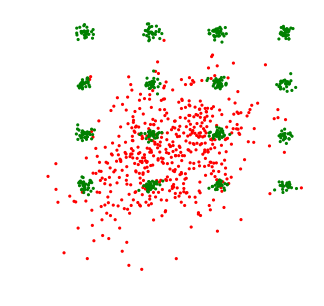

 59%|█████▉    | 47589/80001 [10:13<06:11, 87.32it/s]

In [ ]:
xmax = 3
fs = []
frames = []
np_samples = []
n_batches_viz = 10
viz_every = params['viz_every']
nn_every = 200
y_ref = sess.run( data)
nn_dist = []
nn_kl =[]
for i in tqdm(range(params['max_iter']+1)):
#     f, _, _ = sess.run([[loss], g_train_op, d_train_op])
    f, _= sess.run([[loss], train_op])

    fs.append(f)
    if (i) % viz_every == 0:
        np_samples.append(np.vstack([sess.run(samples) for _ in range(n_batches_viz)]))
        xx, yy = sess.run([samples, data])
        fig = figure(figsize=(5,5))
        scatter(xx[:, 0], xx[:, 1], c='r', edgecolor='none',s=10)
        scatter(yy[:, 0], yy[:, 1], c='g', edgecolor='none',s=10)
        axis('off')
        show()
        
#     if (i) % nn_every == 0:
#         x = np.vstack([sess.run(samples) for _ in range(n_batches_viz)])
#         l2nn = nn_l2_mean(x,y_ref)
#         kl =estimate(x, y_ref,k=1)
#         nn_dist.append(l2nn)
#         nn_kl.append(kl)
#         print('dist = ', l2nn)
#         print('kl = ', kl)

    

In [ ]:
np_samples_ = np_samples[::1]
cols = len(np_samples_)
bg_color  = sns.color_palette('Greens', n_colors=256)[0]
figure(figsize=(2*cols, 2))
for i, samps in enumerate(np_samples_):
    if i == 0:
        ax = subplot(1,cols,1)
    else:
        subplot(1,cols,i+1, sharex=ax, sharey=ax)
#     ax2 = sns.kdeplot(samps[:, 0], samps[:, 1], shade=True, cmap='Greens', n_levels=20, clip=[[-6,6]]*2)
    ax2 = sns.kdeplot(samps[:, 0], samps[:, 1], shade=True, cmap='coolwarm',bw=.40, n_levels=20, clip=[[-6,6]]*2)

#     ax2.set_axis_bgcolor(bg_color)
    xticks([]); yticks([])
    title('step %d'%(i*viz_every))
gcf().tight_layout()

In [ ]:
plt.semilogy(nn_dist)
plt.semilogy(nn_kl)
plt.legend(['kl','l2 nearest neigbhors'])
xlabel('iterations')
plt.show()

In [ ]:
np.save('plot_con_kl',nn_kl)
np.save('plot_con_nn',nn_dist)